# Plot abrupt4xCO2 anomalies and fit different linear responses

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import os
import random as rd
from lmfit import Model
from lmfit.model import save_modelresult, load_modelresult
from scipy import optimize
import importlib
import xarray as xr
from data_loading_functions import *

plt.rcParams.update({'figure.max_open_warning': 0})

In [2]:
exp = 'abrupt-4xCO2'
#exp = 'abrupt-2xCO2'
#exp = 'abrupt-0p5xCO2'

model_anom_names = [ f.name for f in os.scandir('../../Processed_data/Global_annual_anomalies/') if f.is_dir() and f.name !='.ipynb_checkpoints']
model_anom_names.sort()

member_dict = {}
for model in model_anom_names:
    anom_exp = [ f.name for f in os.scandir('../../Processed_data/Global_annual_anomalies/' + model) if f.is_dir() and f.name !='.ipynb_checkpoints']
    if exp in anom_exp:
        member_dict[model] = find_members(model, exp)
member_dict

{'ACCESS-CM2': ['r1i1p1f1'],
 'ACCESS-ESM1-5': ['r1i1p1f1', 'r2i1p1f1'],
 'AWI-CM-1-1-MR': ['r1i1p1f1'],
 'BCC-CSM2-MR': ['r1i1p1f1'],
 'BCC-ESM1': ['r1i1p1f1'],
 'CAMS-CSM1-0': ['r1i1p1f1', 'r2i1p1f1'],
 'CAS-ESM2-0': ['r1i1p1f1'],
 'CESM2': ['r1i1p1f1'],
 'CESM2-FV2': ['r1i1p1f1'],
 'CESM2-WACCM': ['r1i1p1f1'],
 'CESM2-WACCM-FV2': ['r1i1p1f1'],
 'CIESM': ['r1i1p1f1'],
 'CMCC-CM2-SR5': ['r1i1p1f1'],
 'CMCC-ESM2': ['r1i1p1f1'],
 'CNRM-CM6-1': ['r1i1p1f2',
  'r2i1p1f2',
  'r3i1p1f2',
  'r4i1p1f2',
  'r5i1p1f2',
  'r6i1p1f2'],
 'CNRM-CM6-1-HR': ['r1i1p1f2'],
 'CNRM-ESM2-1': ['r1i1p1f2', 'r2i1p1f2', 'r3i1p1f2'],
 'CanESM5': ['r1i1p1f1', 'r1i1p2f1'],
 'E3SM-1-0': ['r1i1p1f1'],
 'EC-Earth3': ['r3i1p1f1', 'r8i1p1f1'],
 'EC-Earth3-AerChem': ['r1i1p1f1'],
 'EC-Earth3-CC': ['r1i1p1f1'],
 'EC-Earth3-Veg': ['r1i1p1f1'],
 'FGOALS-f3-L': ['r1i1p1f1', 'r2i1p1f1', 'r3i1p1f1'],
 'FGOALS-g3': ['r1i1p1f1'],
 'GFDL-CM4': ['r1i1p1f1'],
 'GFDL-ESM4': ['r1i1p1f1'],
 'GISS-E2-1-G': ['r102i1p1f1', 'r1i1p1f1',

## Define linear temperature models

In [3]:
def exp_part1(t, S1, tau1):
    return S1*(1 - np.exp(-t/tau1))
def exp_part2(t, S2, tau2):
    return S2*(1 - np.exp(-t/tau2))
def exp_part3(t, S3, tau3):
    return S3*(1 - np.exp(-t/tau3))
def osc_parts(t, Sosc1, Sosc2, taup, Tq):
    p = -1/taup; q = 2*np.pi/Tq
    osc_part1 = Sosc1*(1 - np.exp(-t/taup)*(np.cos(q*t) + p/q*np.sin(q*t)))
    osc_part2 = Sosc2*(1 - np.exp(-t/taup)*(np.cos(q*t) - q/p*np.sin(q*t)))
    return osc_part1 + osc_part2

def twoexp_function(t, S1, S2, tau1, tau2):
    return exp_part1(t, S1, tau1) + exp_part2(t, S2, tau2)
def threeexp_function(t, S1, S2, S3, tau1, tau2, tau3):
    return exp_part1(t, S1, tau1) + exp_part2(t, S2, tau2) + exp_part3(t, S3, tau3)
def expandosc_function(t, S1, S2, Sosc1, Sosc2, tau1, tau2, taup, Tq):
    return exp_part1(t, S1, tau1) + exp_part2(t, S2, tau2) + osc_parts(t, Sosc1, Sosc2, taup, Tq)

exp_model1 = Model(exp_part1); exp_model2 = Model(exp_part2); 
twoexp_model = Model(twoexp_function);
twoexp_model.set_param_hint('S1', value=4, min=0, max=10.0)
twoexp_model.set_param_hint('S2', value=2, min=0, max=10.0)
twoexp_model.set_param_hint('tau1', value=4, min=0, max=8)
twoexp_model.set_param_hint('tau2', value=20, min=8, max=1000)

exp_model3 = Model(exp_part3); threeexp_model = Model(threeexp_function);
threeexp_model.set_param_hint('S1', value=4, min=0, max=10.0)
threeexp_model.set_param_hint('S2', value=2, min=0, max=10.0)
threeexp_model.set_param_hint('S3', value=2, min=0, max=10.0)
threeexp_model.set_param_hint('tau1', value=4, min=0, max=8)
threeexp_model.set_param_hint('tau2', value=20, min=8, max=100)
threeexp_model.set_param_hint('tau3', value=200, min=100, max=1000)

osc_model = Model(osc_parts); expandosc_model = Model(expandosc_function)
expandosc_model.set_param_hint('S1', value=4, min=0, max=10.0)# guess the same as for two-box model 
expandosc_model.set_param_hint('S2', value=2, min=0, max=10.0)
expandosc_model.set_param_hint('Sosc1', value=0.5, min=0, max=4.0)
expandosc_model.set_param_hint('Sosc2', value=0.5, min=0, max=4.0)
expandosc_model.set_param_hint('tau1', value=4, min=0, max=8)
expandosc_model.set_param_hint('tau2', value=20, min=8, max=1000)


expandosc_model.set_param_hint('taup', value=600, min=20, max=1000)
#expandosc_model.set_param_hint('Tq', value=400, min=40, max=2000) # used for longrunmip
expandosc_model.set_param_hint('Tq', value=100, min=40, max=2000)

In [4]:
def modelresult_figure(response_model, model_result, years0, deltaT0, axis = None):
    # takes in response models: 'twoexp', 'threeexp', 'expandosc'
    if axis == None:
        #then create new axis:
        fig, axis = plt.subplots(figsize = [8,6])
        
    axis.set_xlabel('Year',fontsize = 18)
    axis.set_ylabel('T [K]',fontsize = 18)
    axis.set_xlim(min(years0),max(years0))
    axis.tick_params(axis='both',labelsize=18)
    axis.plot(years0, deltaT0, color = 'black')
    
    residuals = model_result.best_fit - model_result.data
    model_rmse = np.sqrt(np.mean(residuals**2))
    #model_rmse = np.sqrt(np.mean(model_result.residual**2))
    axis.plot(years0, model_result.best_fit, '-', label='best fit', color = 'blue', linewidth = 2)
    
    # plot components
    axis.plot(years0, exp_model1.eval(model_result.params, t=years0), color = 'lightblue')
    axis.plot(years0, exp_model2.eval(model_result.params, t=years0), color = 'lightblue')
    if response_model == 'twoexp':
        axis.set_title('Two-exponential fit', fontsize = 18)
        partoshow = ['S1', 'S2', 'tau1', 'tau2']
        textlabels = ['$S_1$', '$S_2$', r'$\tau_1$', r'$\tau_2$']
    elif response_model == 'threeexp':
        axis.plot(years0, exp_model3.eval(model_result.params, t=years0), color = 'lightblue')
        axis.set_title('Three-exponential fit', fontsize = 18)
        partoshow = ['S1', 'S2', 'S3', 'tau1', 'tau2', 'tau3']
        textlabels = ['$S_1$', '$S_2$', '$S_3$', r'$\tau_1$', r'$\tau_2$', r'$\tau_3$']
    elif response_model == 'expandosc':
        axis.plot(years0, osc_model.eval(model_result.params, t=years0), color = 'lightblue')
        axis.set_title('Two-exponential and oscillatory fit', fontsize = 18)
        partoshow = ['S1', 'S2', 'Sosc1', 'Sosc2', 'tau1', 'tau2', 'taup', 'Tq']
        textlabels = ['$S_1$', '$S_2$', '$S_{osc1}$', '$S_{osc2}$', r'$\tau_1$', r'$\tau_2$', r'$\tau_p$', r'$T_q$']
        
    estimates = [model_result.best_values[par] for par in partoshow]
    axis.text(0.01, 0.95, 'RMSE = ' + str(np.round(model_rmse,3)), transform=axis.transAxes, fontsize = 16)
    axis.text(0.75,0.55, 'Estimates:', fontsize=14, transform=axis.transAxes)
    for (ind, estimate) in enumerate(estimates):
        axis.text(0.75,0.5*(1-ind/8),textlabels[ind] + ' = ' + str('{:.2f}'.format(np.round(estimate,2))), fontsize=14, transform=axis.transAxes)
    return axis
    

In [5]:
def plot_3fits(years0, deltaT0, model, exp, member, load_results = False, save_results = False, save_figure = False):
    fig, ax = plt.subplots(ncols = 3, figsize = [25,6]);
    fig.suptitle(model + ' ' + member + ' responses to ' + exp, fontsize = 22)
    response_models = ['twoexp', 'threeexp', 'expandosc']
    response_functions = [twoexp_function, threeexp_function, expandosc_function]
    
    rmse_values = []
    for (ax_index, axis) in enumerate(ax):
        response_model = response_models[ax_index]; response_function = response_functions[ax_index]
        
        result_file = '../model_results/' + model + '_' + exp + '_' + member + '_' + response_model + '_results.sav'
        if load_results == True:
            model_result = load_modelresult(result_file, funcdefs = {response_model + '_function': response_function})
            #model_rmse = np.sqrt(np.mean(model_result.residual**2))
            # attribute residual seems to be missing
            # but we can compute it manually from other attributes:
            residuals = model_result.best_fit - model_result.data
            model_rmse = np.sqrt(np.mean(residuals**2))
        else: # obtain new results
            if response_model == 'twoexp':
                model_to_fit = twoexp_model
            elif response_model == 'threeexp':
                model_to_fit = threeexp_model
            elif response_model == 'expandosc':
                model_to_fit = expandosc_model
                 
            model_result = model_to_fit.fit(deltaT0, t=years0)
            model_rmse = np.sqrt(np.mean(model_result.residual**2))
            if response_model == 'expandosc':
                twoexp_rmse = rmse_values[0]
                #if model_rmse > twoexp_rmse: 
                i=0;
                #while model_rmse > twoexp_rmse: # if worse than twoexp, then make new fit
                #    print(i, model, exp)
                #    taup_guess = 10**rd.uniform(np.log10(20), np.log10(1000))
                #    Tq_guess = 10**rd.uniform(np.log10(40), np.log10(2000))
                #    expandosc_model.set_param_hint('taup', value=taup_guess, min=20, max=1000)
                #    expandosc_model.set_param_hint('Tq', value=Tq_guess, min=40, max=2000)
                #    model_result = expandosc_model.fit(deltaT0, t=years0)
                #    model_rmse = np.sqrt(np.mean(model_result.residual**2))
                #    i += 1; 
                # reset par hints:
                #expandosc_model.set_param_hint('taup', value=600, min=20, max=1000)
                #expandosc_model.set_param_hint('Tq', value=100, min=40, max=2000)
        if save_results == True:
             save_modelresult(model_result, result_file) 
        
        modelresult_figure(response_model, model_result, years0, deltaT0, axis = axis)
        rmse_values.append(model_rmse)
    if save_figure == True:
        plt.savefig('../Figures/CMIP6_modelcomparisons/' + model + '_' + member + '_' + exp + '_linresponses_comparison.pdf', format='pdf', dpi=600, bbox_inches="tight")
    
    return rmse_values
        

ACCESS-CM2


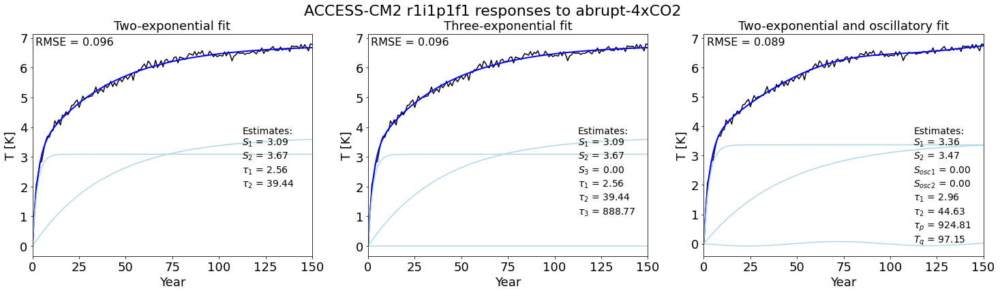

ACCESS-ESM1-5


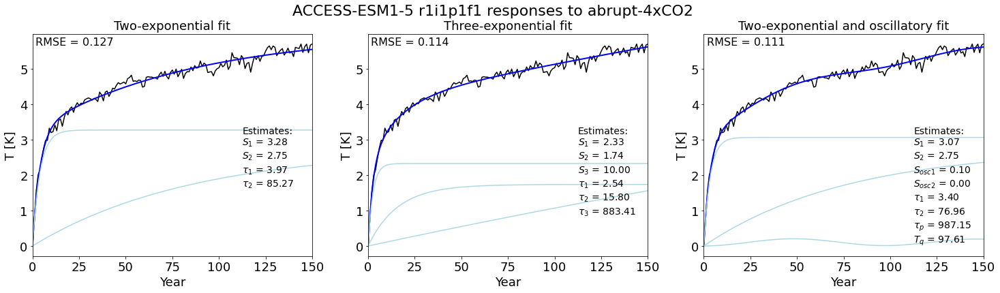

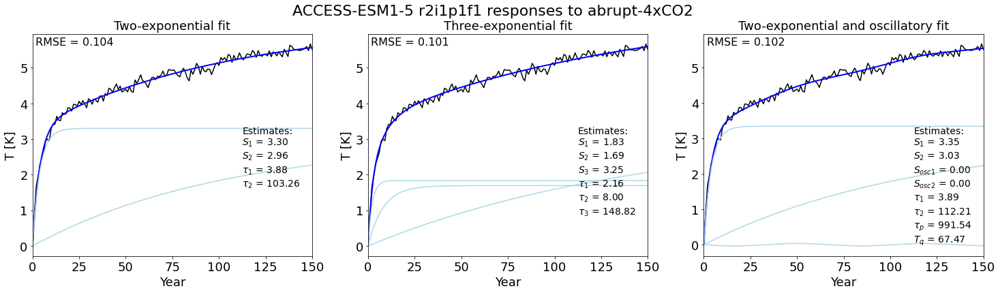

AWI-CM-1-1-MR


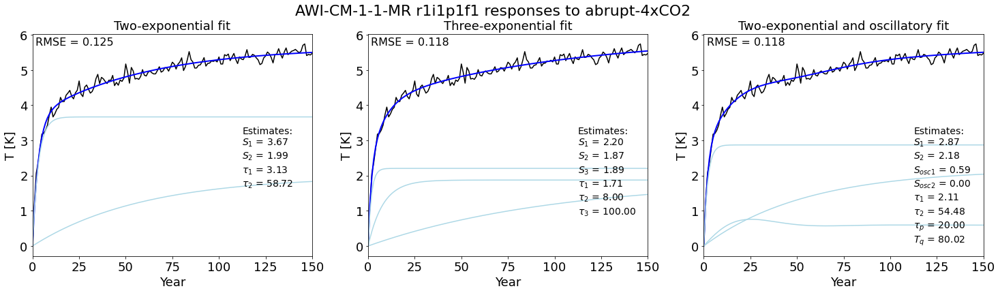

BCC-CSM2-MR


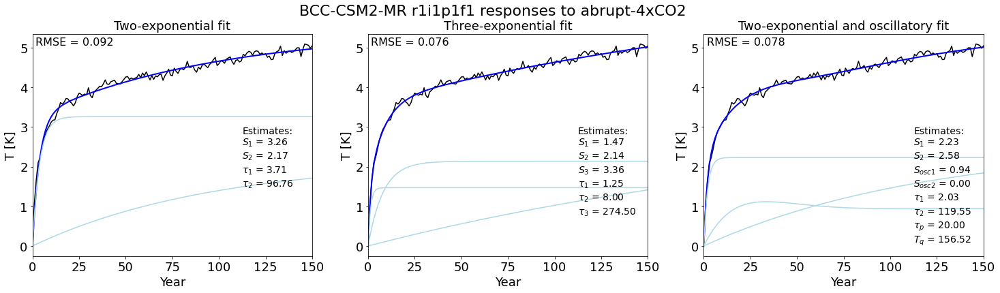

BCC-ESM1


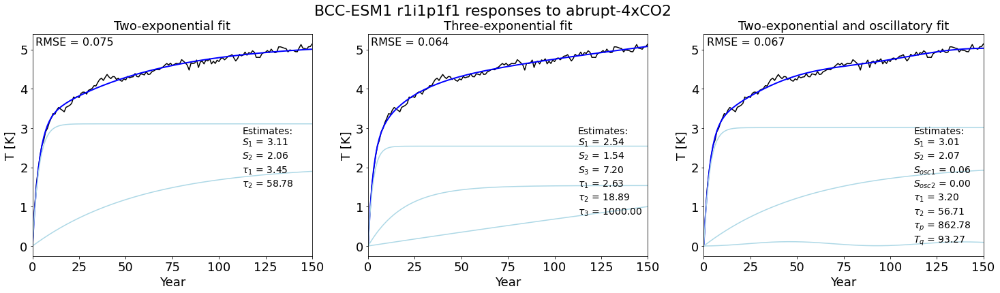

CAMS-CSM1-0


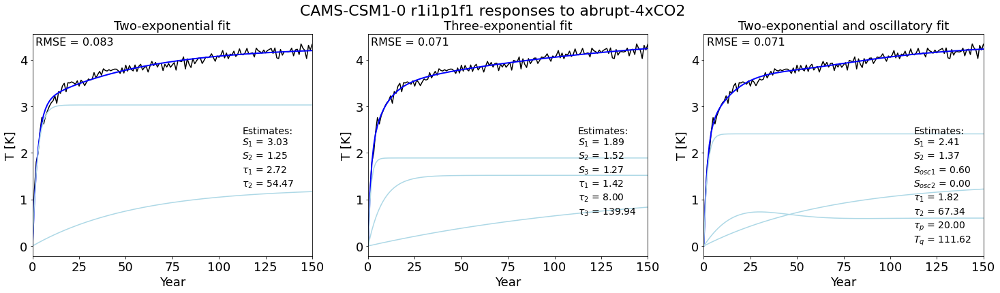

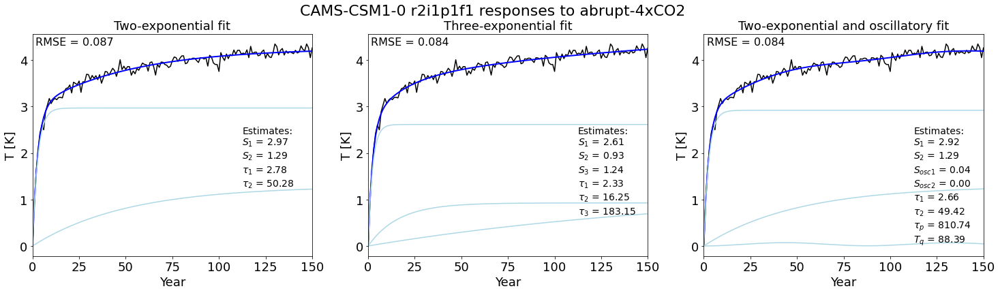

CAS-ESM2-0


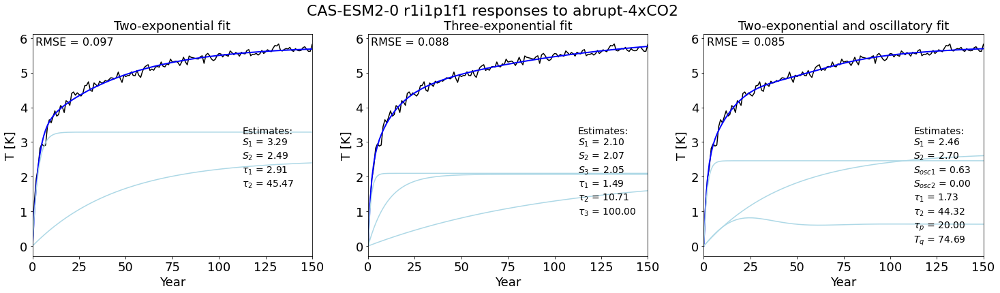

CESM2


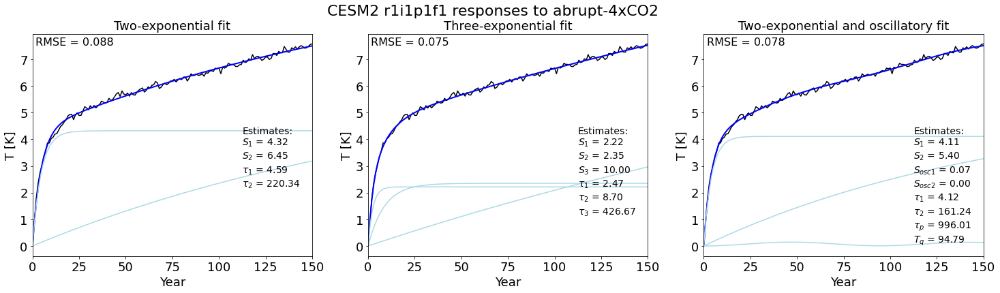

CESM2-FV2


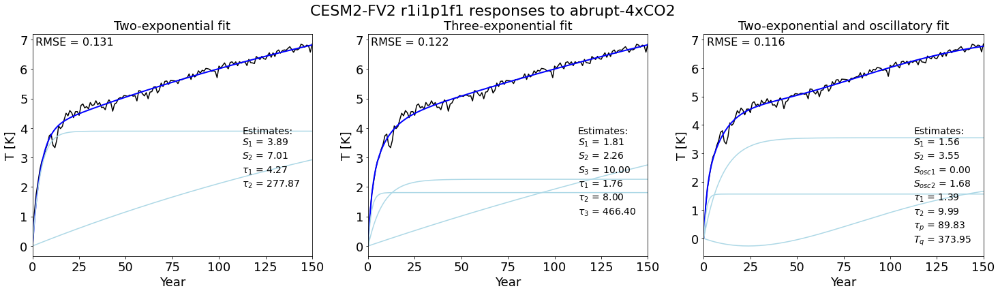

CESM2-WACCM


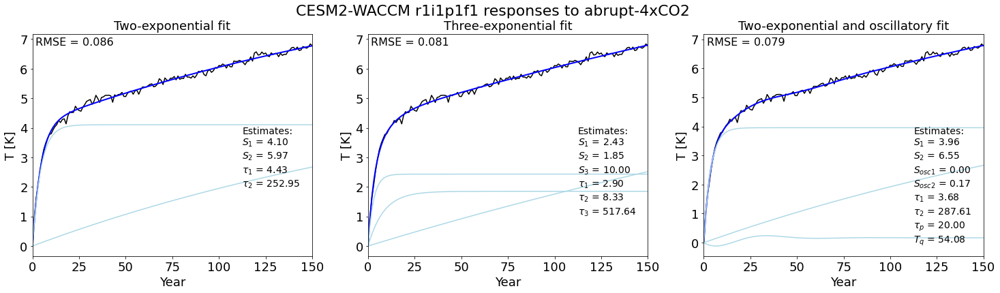

CESM2-WACCM-FV2


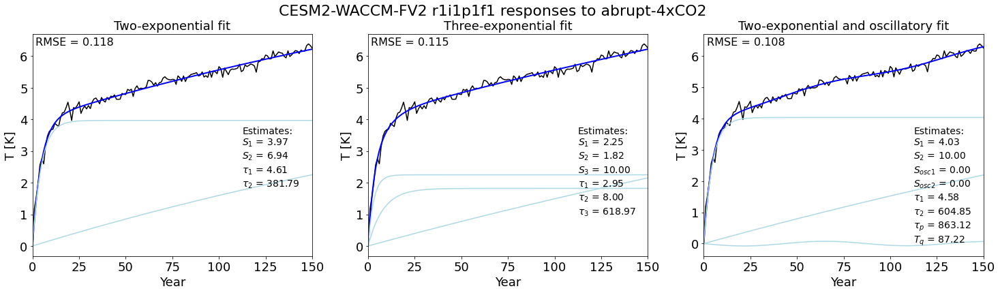

CIESM


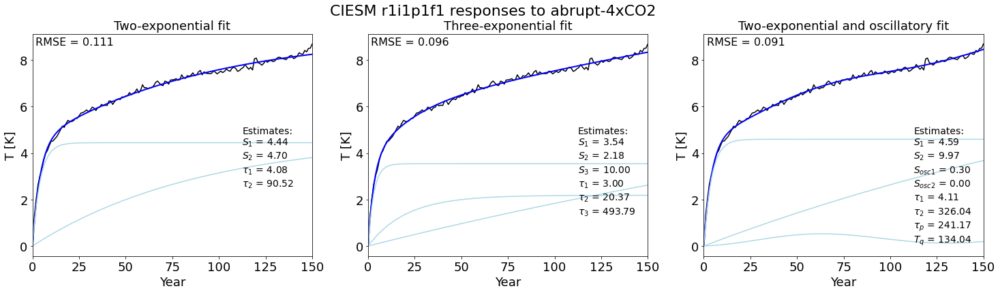

CMCC-CM2-SR5


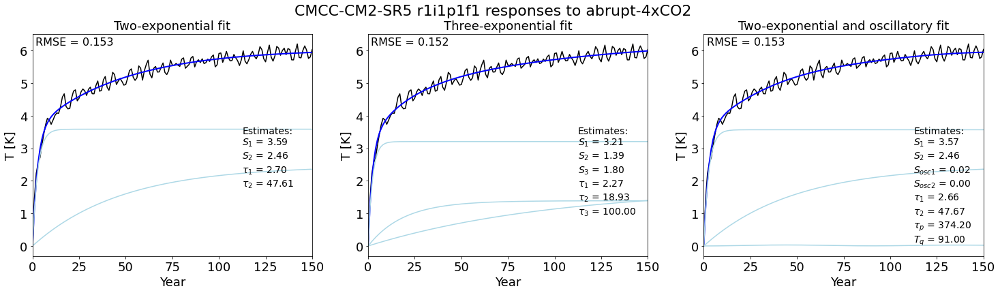

CMCC-ESM2


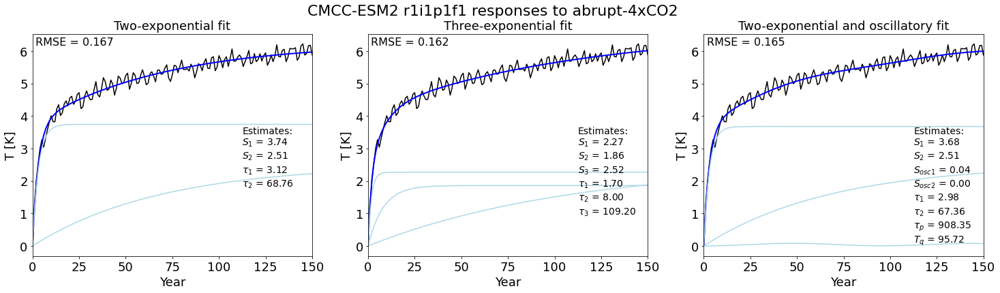

CNRM-CM6-1


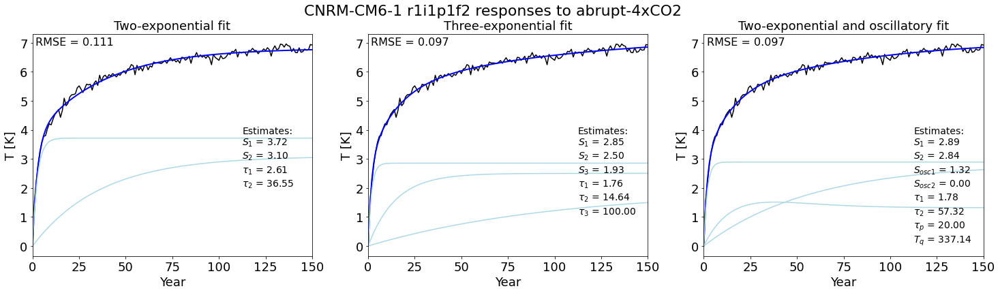

CNRM-CM6-1-HR


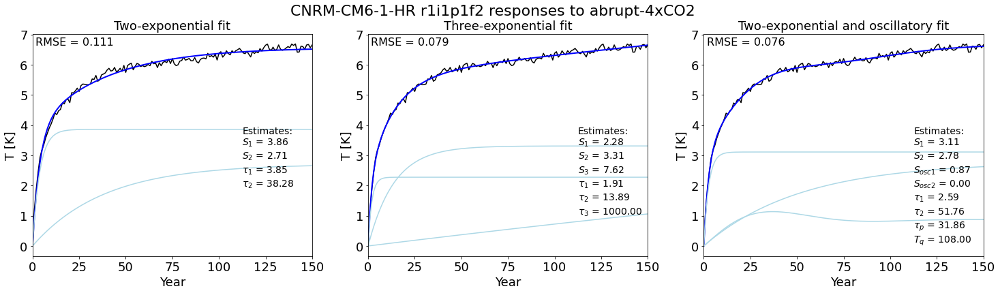

CNRM-ESM2-1


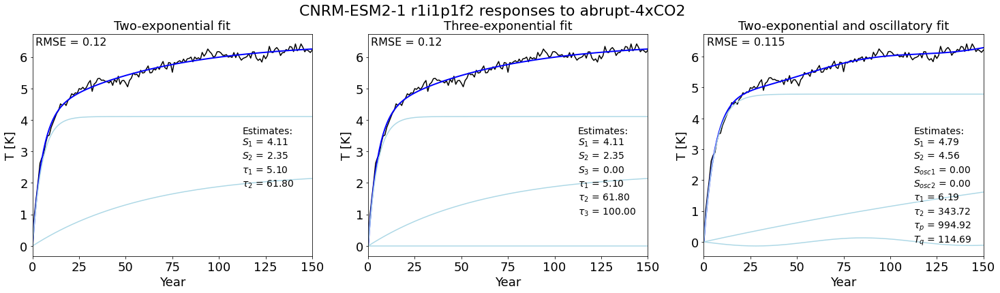

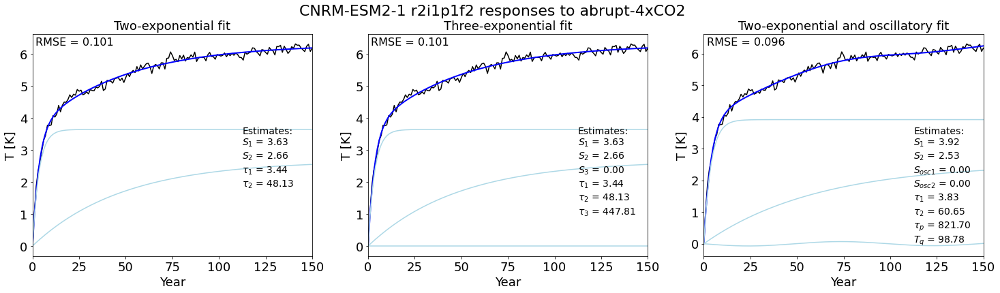

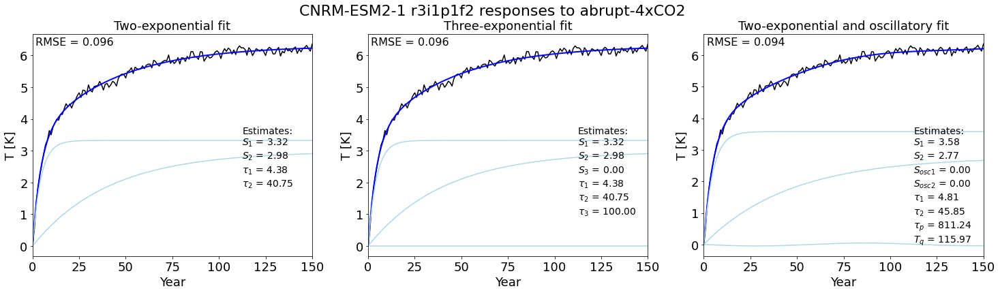

CanESM5


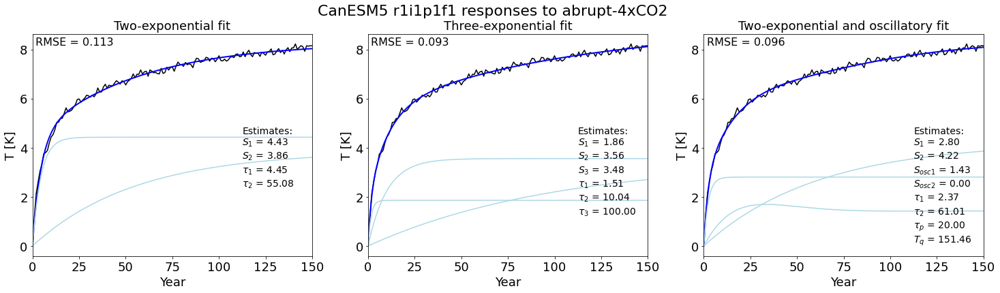

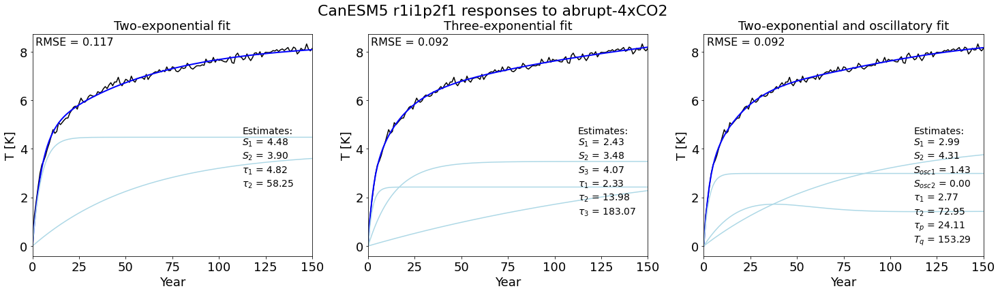

E3SM-1-0


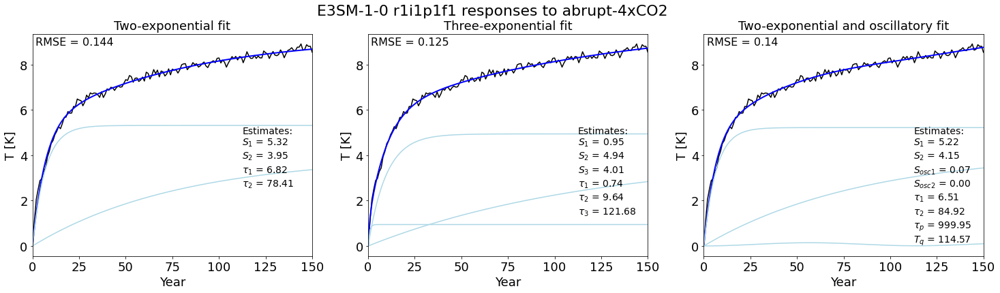

EC-Earth3


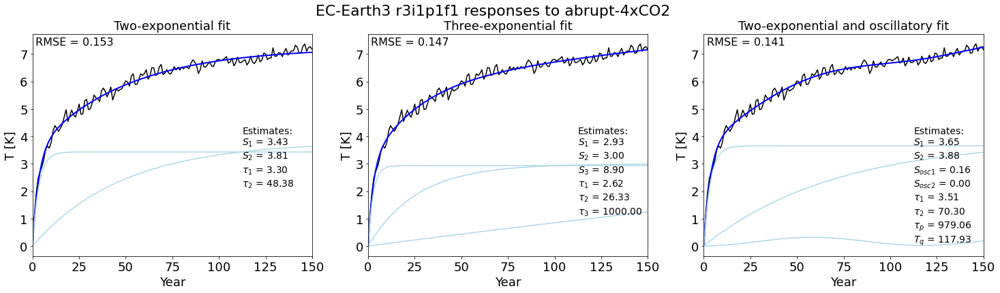

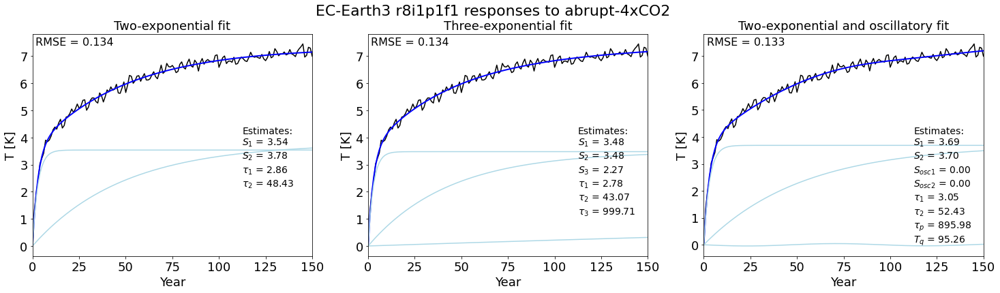

EC-Earth3-AerChem


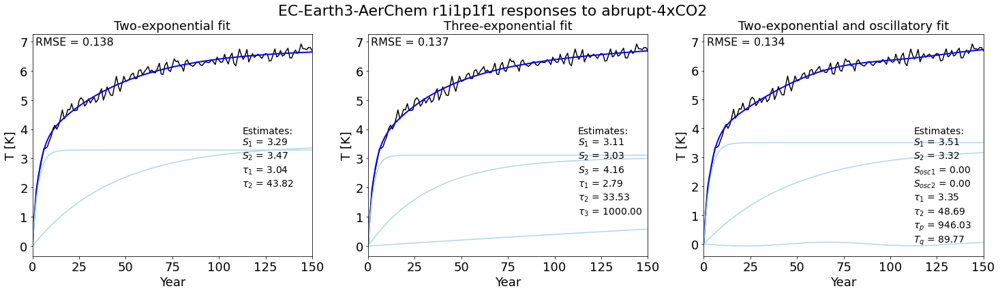

EC-Earth3-CC


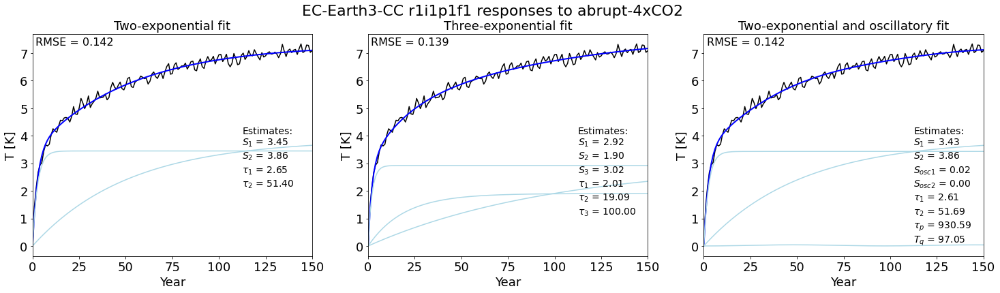

EC-Earth3-Veg


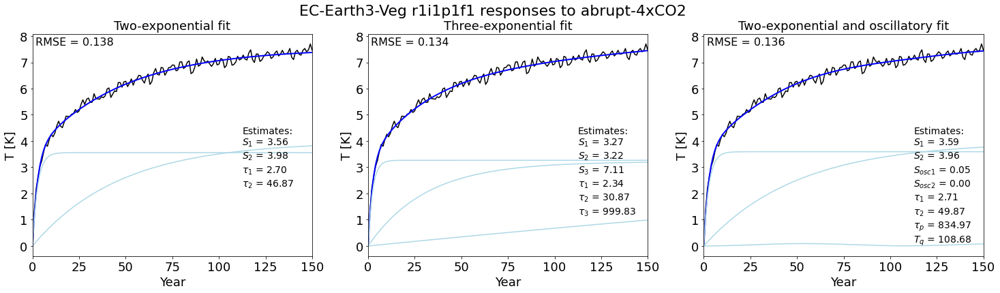

FGOALS-f3-L


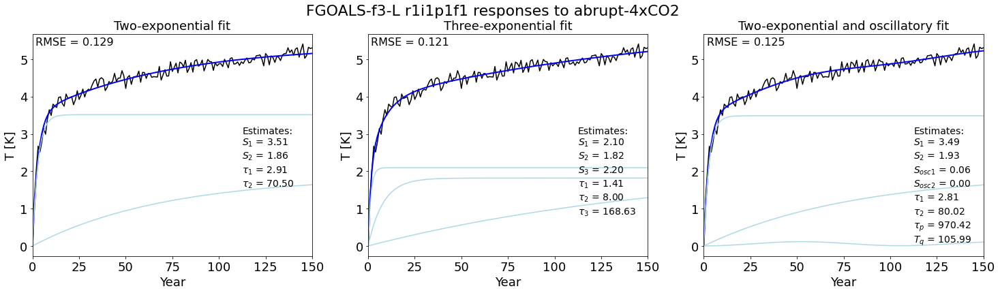

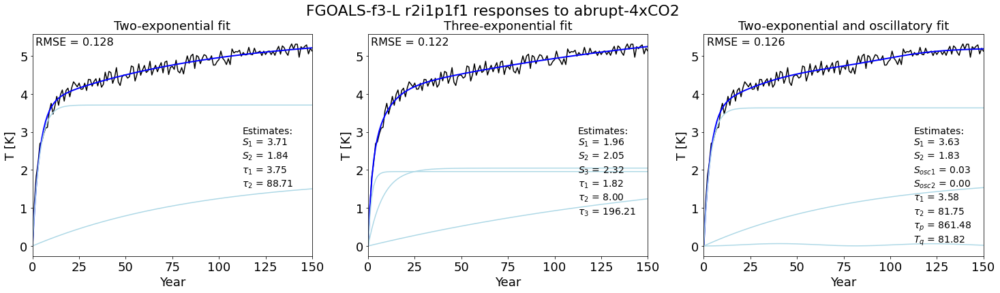

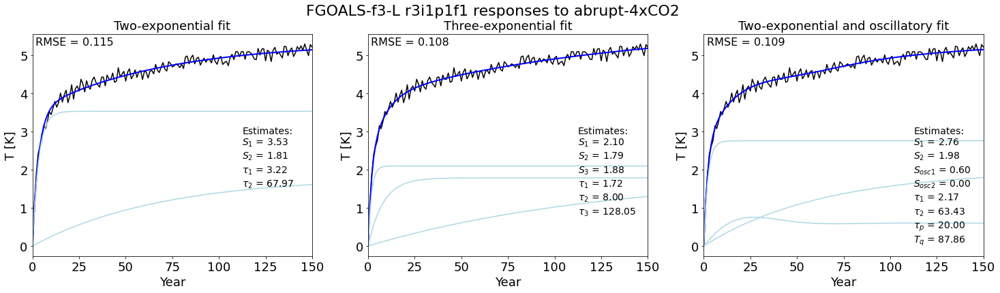

FGOALS-g3


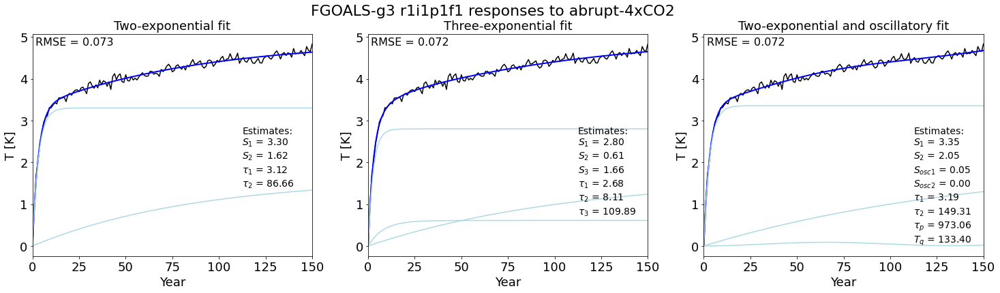

GFDL-CM4


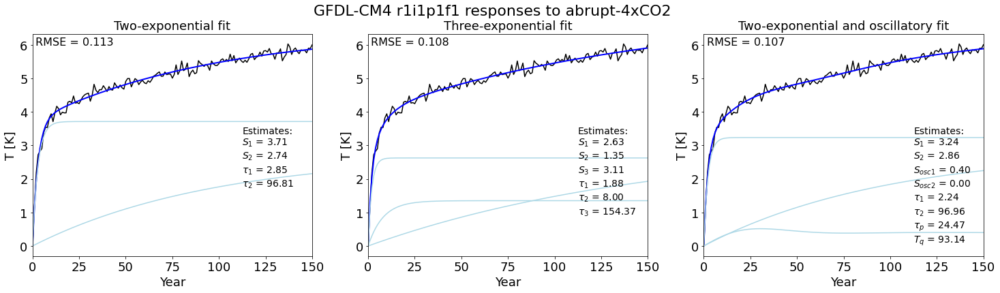

GFDL-ESM4


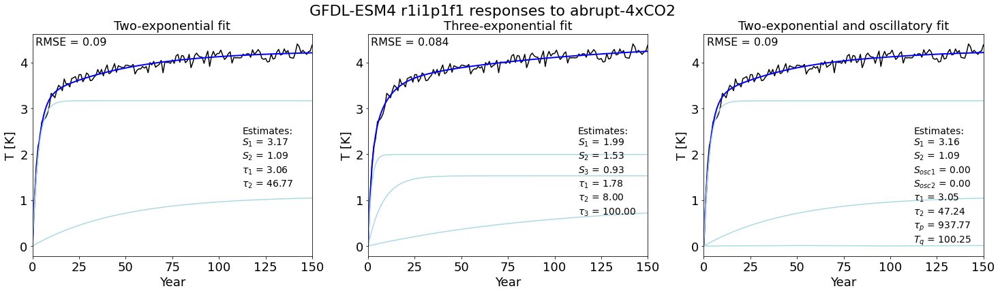

GISS-E2-1-G


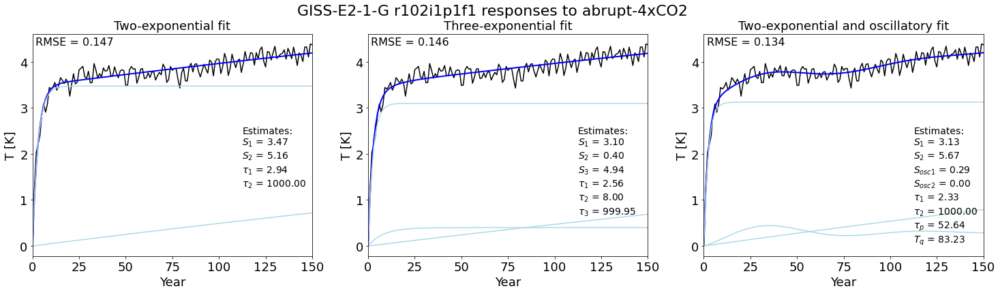

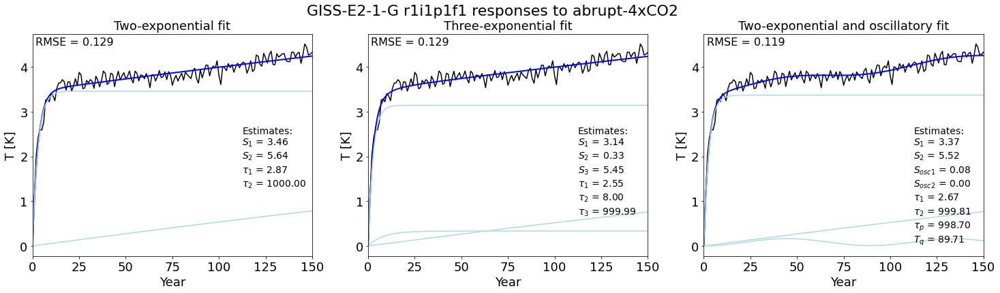

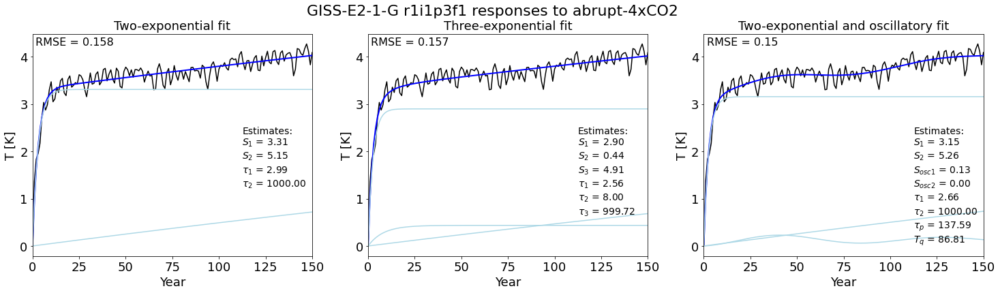

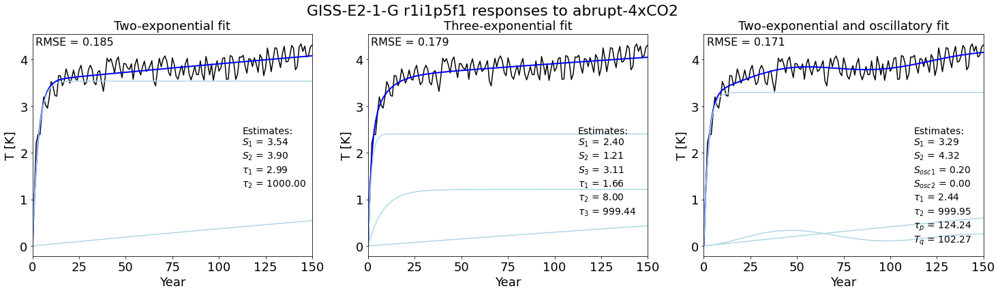

GISS-E2-1-H


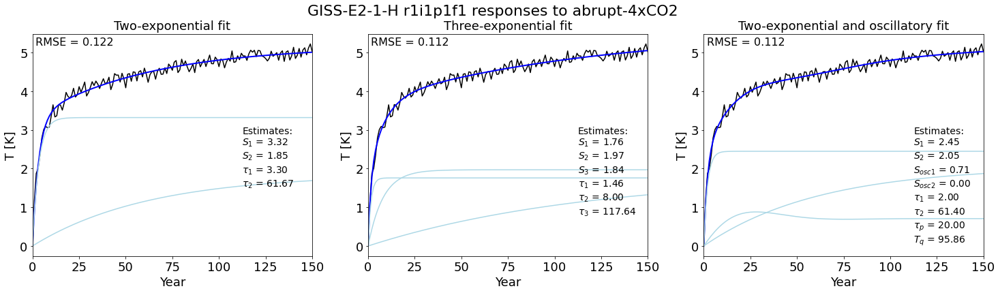

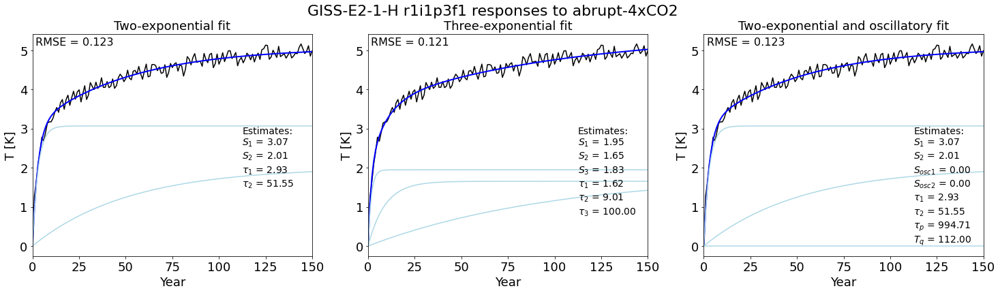

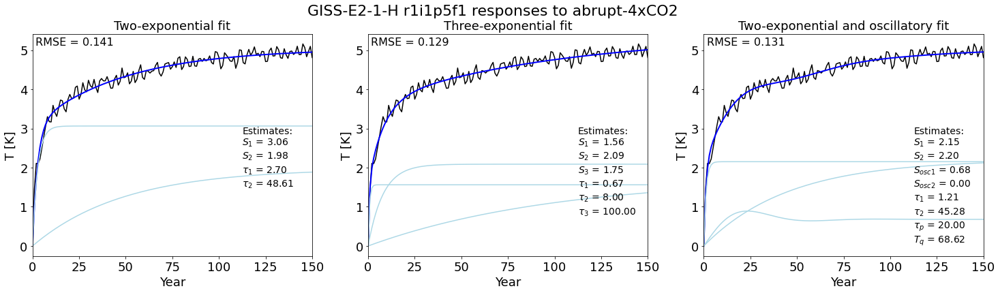

GISS-E2-2-G


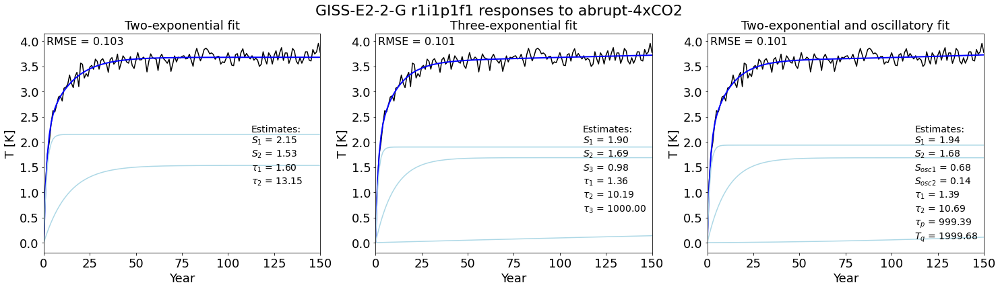

GISS-E2-2-H


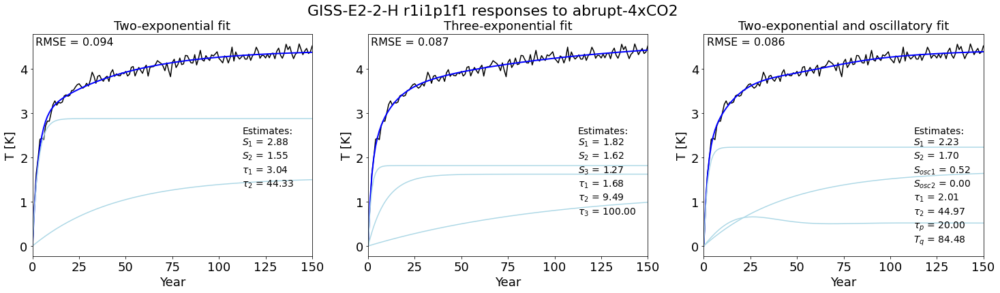

HadGEM3-GC31-LL


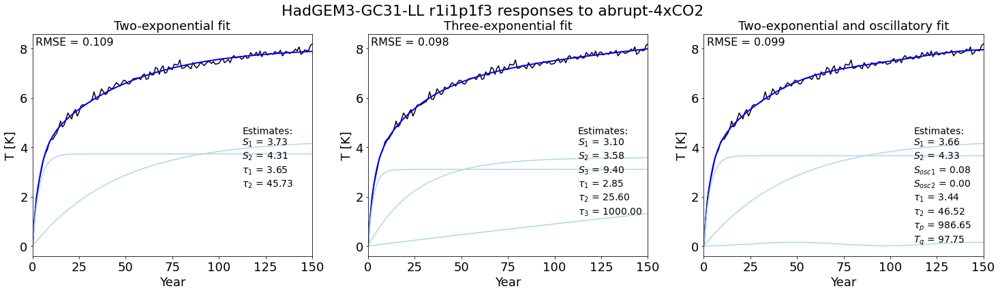

HadGEM3-GC31-MM


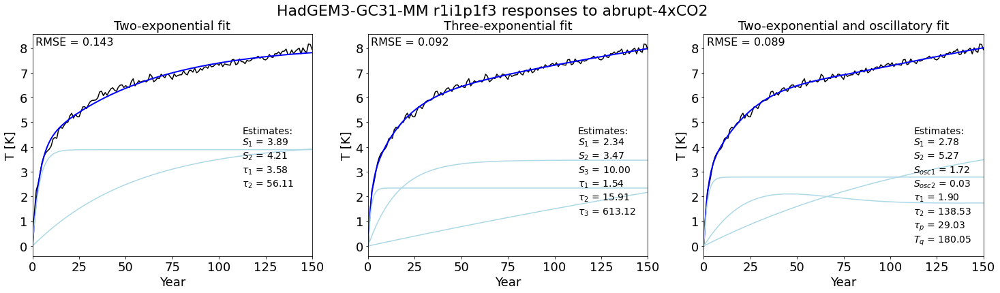

ICON-ESM-LR


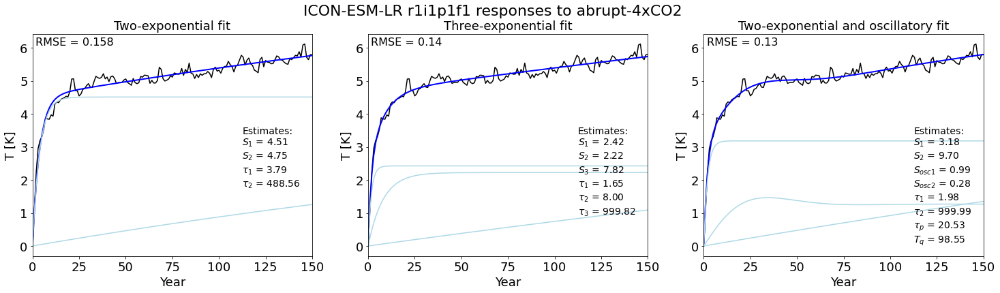

IITM-ESM


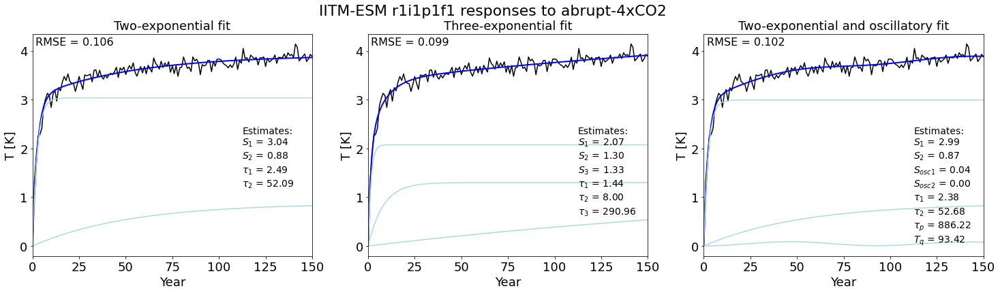

INM-CM4-8


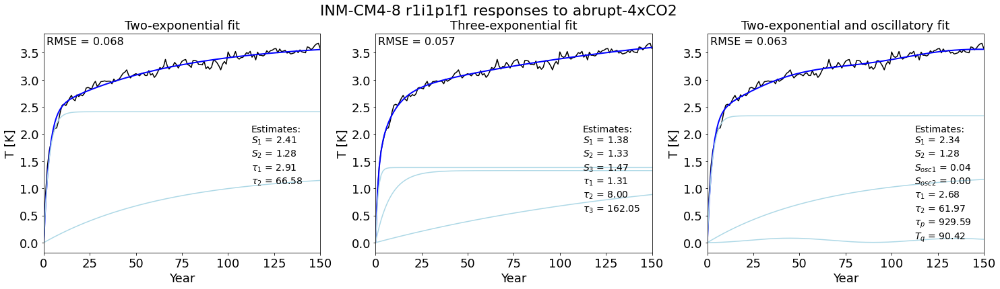

INM-CM5-0


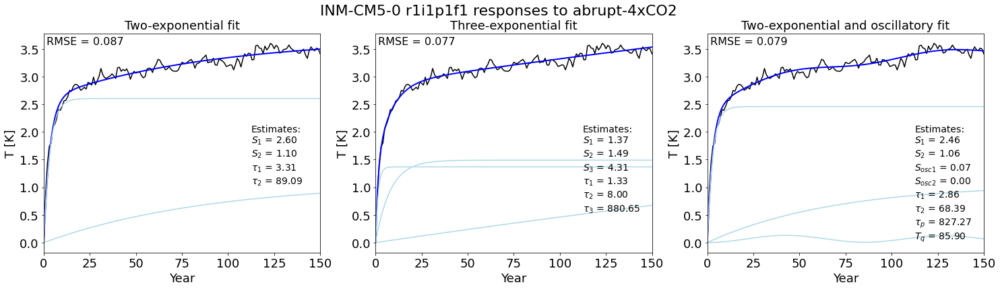

IPSL-CM5A2-INCA


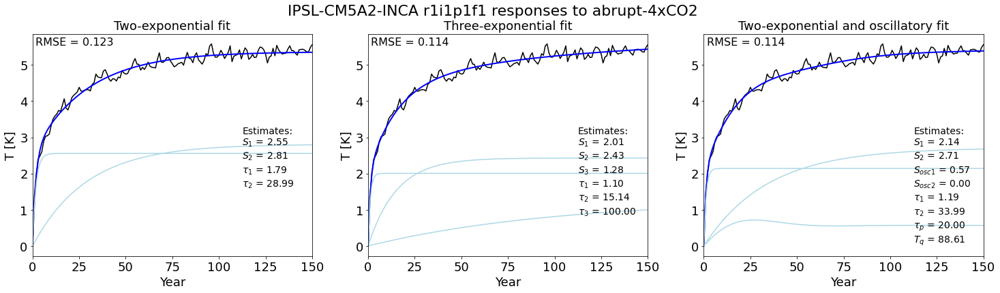

IPSL-CM6A-LR


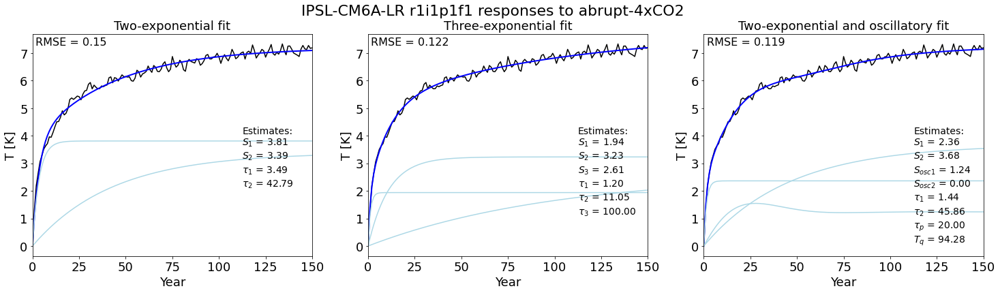

KIOST-ESM


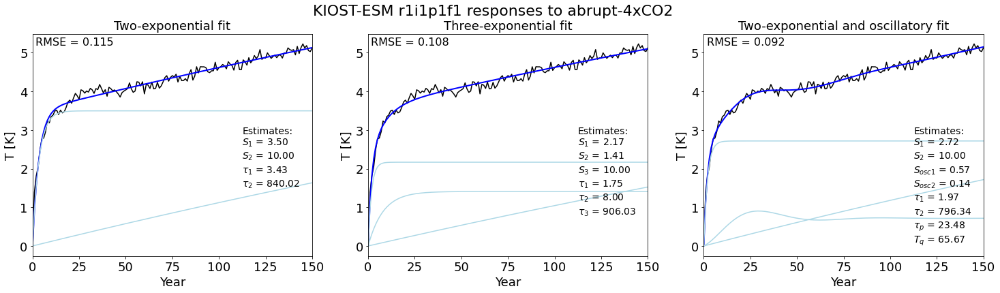

MIROC-ES2H
MIROC-ES2L


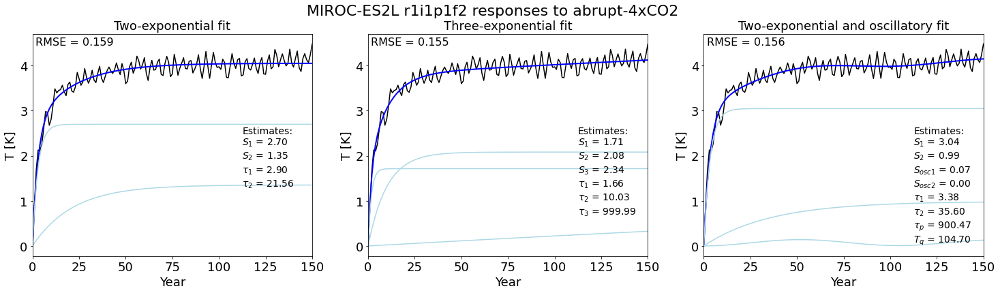

MIROC6


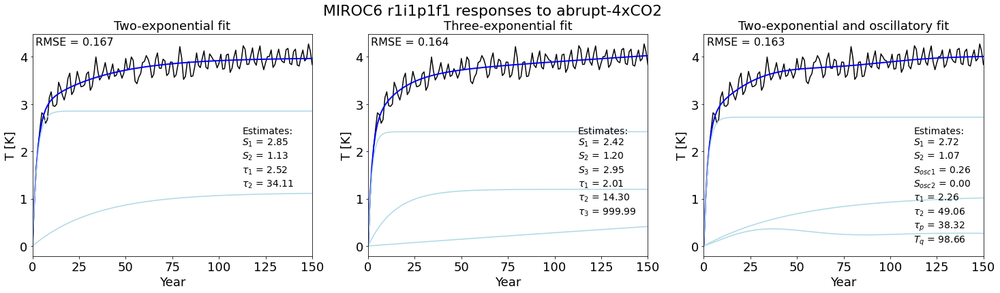

MPI-ESM-1-2-HAM


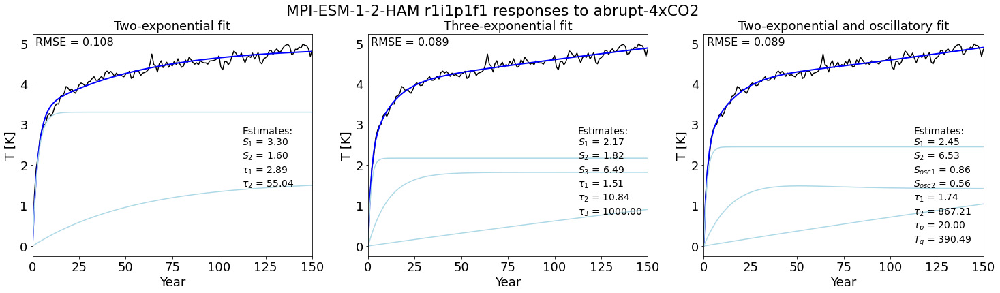

MPI-ESM1-2-HR


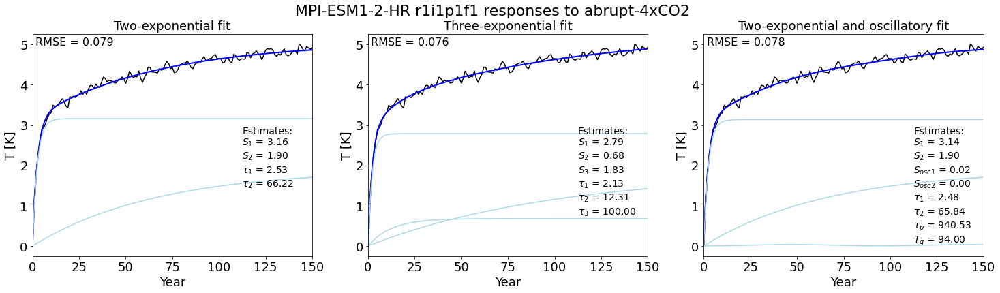

MPI-ESM1-2-LR


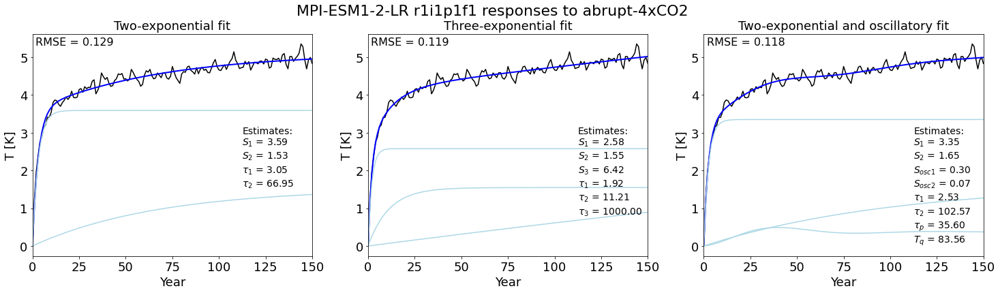

MRI-ESM2-0


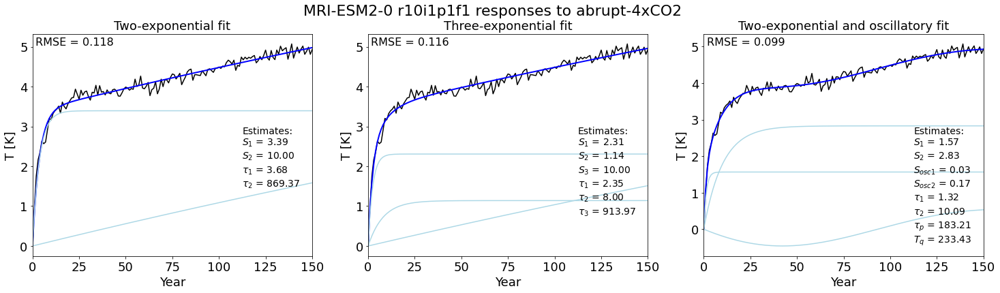

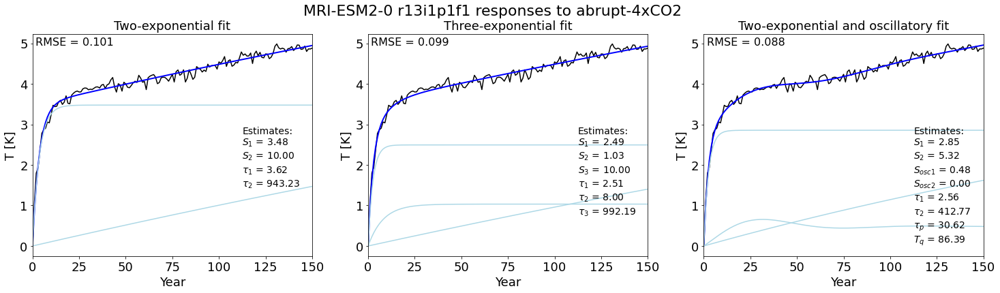

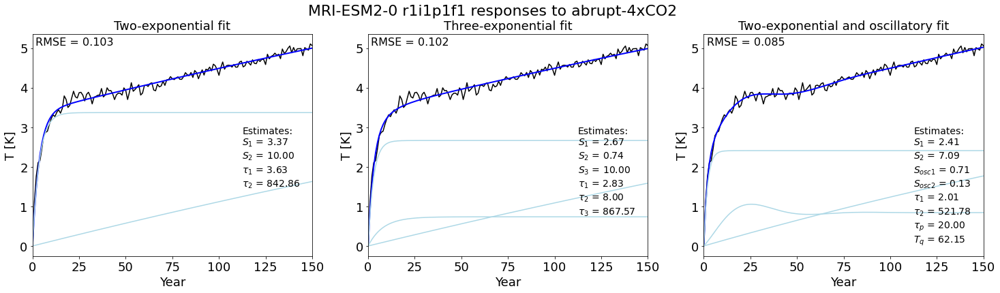

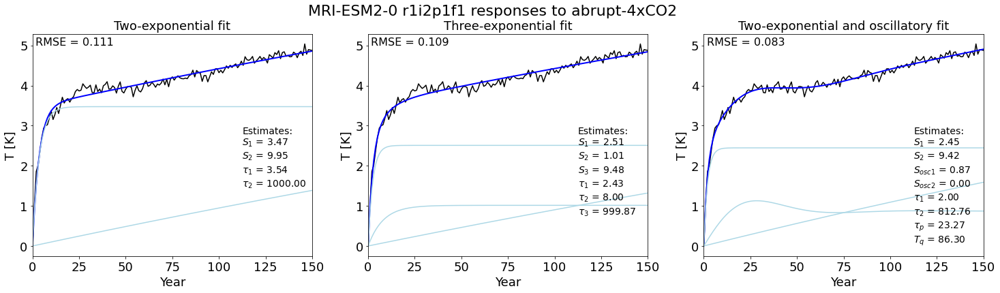

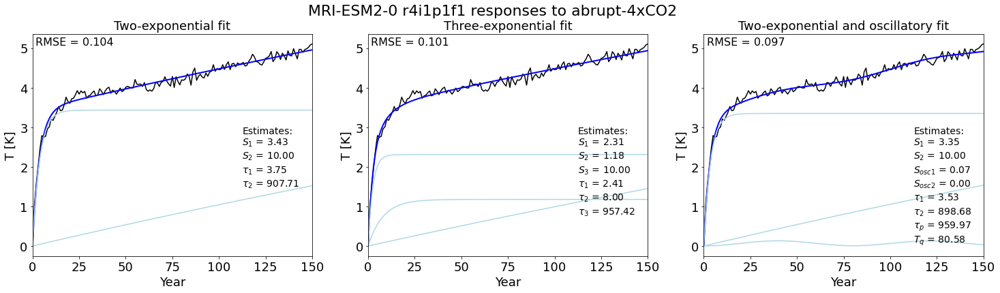

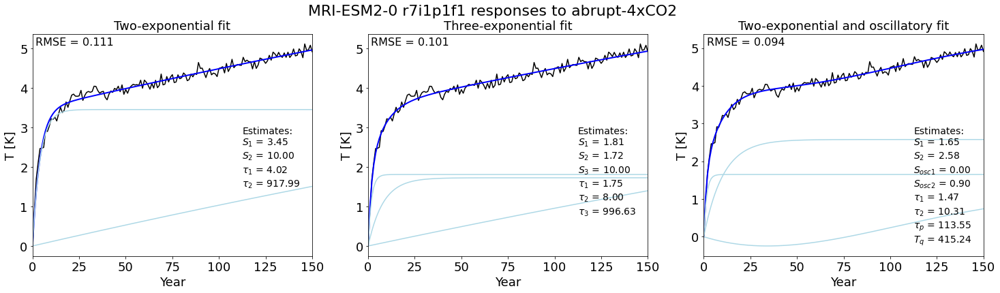

NESM3


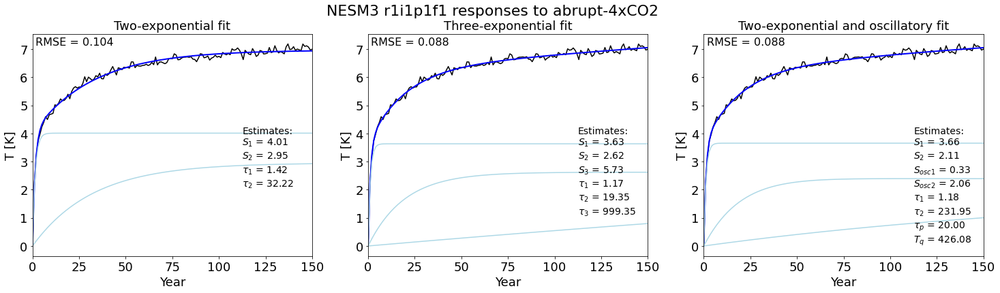

NorCPM1


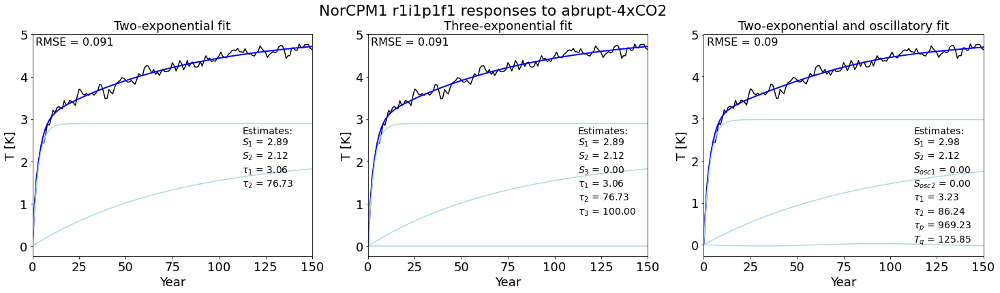

NorESM2-LM


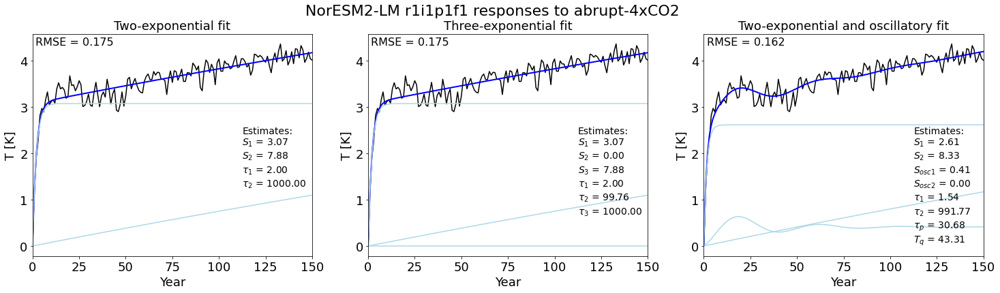

NorESM2-MM


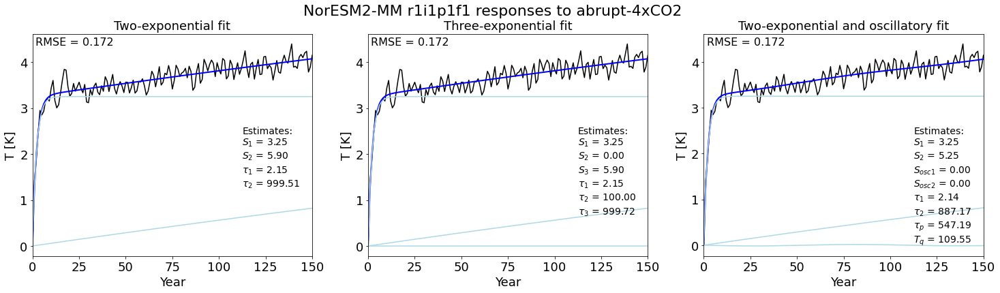

SAM0-UNICON


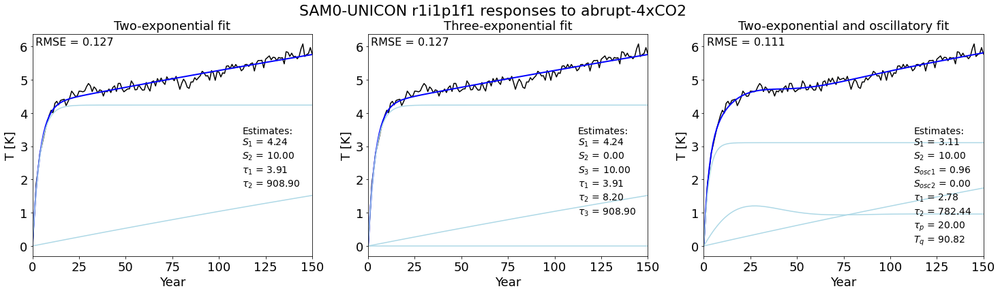

TaiESM1


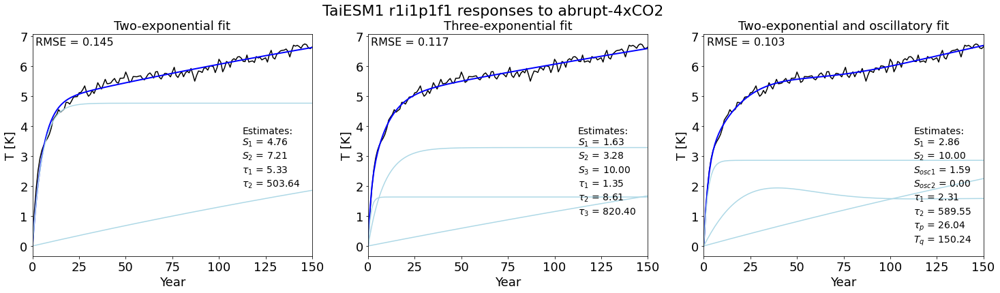

UKESM1-0-LL


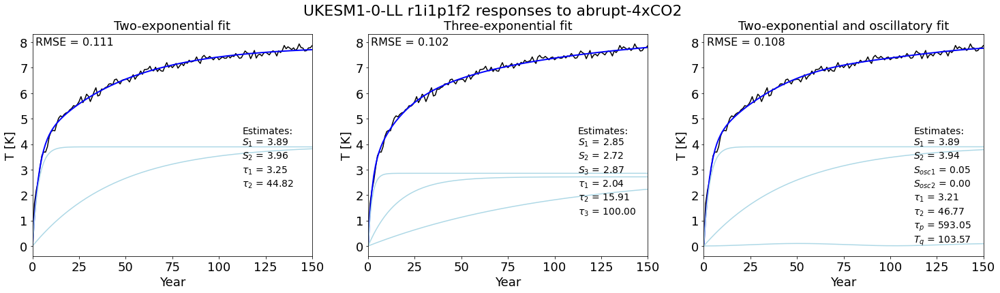

{'ACCESS-CM2': {'r1i1p1f1': [0.0958135114071507,
   0.09581351140875066,
   0.0888563639562056]},
 'ACCESS-ESM1-5': {'r1i1p1f1': [0.12689772378336397,
   0.11371053513437938,
   0.11099354370942863],
  'r2i1p1f1': [0.10413949364061112, 0.10097833521334534, 0.10185861498286185]},
 'AWI-CM-1-1-MR': {'r1i1p1f1': [0.12450214964585224,
   0.1176674534310529,
   0.11788812862320174]},
 'BCC-CSM2-MR': {'r1i1p1f1': [0.09248300993675306,
   0.07642269178556764,
   0.07786761911700955]},
 'BCC-ESM1': {'r1i1p1f1': [0.0748757984031877,
   0.06445622396408732,
   0.06708732305397792]},
 'CAMS-CSM1-0': {'r1i1p1f1': [0.08287314925450966,
   0.07145002000608974,
   0.07146056695496457],
  'r2i1p1f1': [0.08696123762698418, 0.08369522726205551, 0.08421420895555846]},
 'CAS-ESM2-0': {'r1i1p1f1': [0.09710694865036765,
   0.08782936929782807,
   0.08471333901449751]},
 'CESM2': {'r1i1p1f1': [0.08777654189184414,
   0.07496639560462529,
   0.07822468024233606]},
 'CESM2-FV2': {'r1i1p1f1': [0.131136575134929

In [6]:
rmse_list = []; rmse_dict = {}
#for model in ['ACCESS-CM2']:
#for model in ['MRI-ESM2-0']:
#for model in ['HadGEM3-GC31-LL']:
for model in member_dict:
    rmse_dict[model] = {}
    print(model)
    for member in member_dict[model]:
        data = load_anom(model, exp, member, length_restriction = 150)
        deltaN = data['rsdt'] - data['rsut'] - data['rlut']
        deltaT = data['tas']; years = np.arange(1,150+1)
        if len(deltaT)<150:
            continue
        deltaT0 = np.concatenate(([0],deltaT)); years0 = np.concatenate(([0],years))
        if exp == 'abrupt-0p5xCO2':
            deltaT0 *= -1 # flip signs
            if model == 'HadGEM3-GC31-LL':
                # guess shorter period
                expandosc_model.set_param_hint('Sosc1', value=0.01, min=-0.05, max=0.1)
                expandosc_model.set_param_hint('Sosc2', value=0.01, min=-0.05, max=0.1)
                expandosc_model.set_param_hint('Tq', value=45, min=20, max=60)
                expandosc_model.set_param_hint('taup', value=-85, min=-1000, max=-1)
                

        #plot_3fits(years0, deltaT0, model, exp, member)
        #rmse_values = plot_3fits(years0, deltaT0, model, exp, member, load_results = False, save_results = True)
        rmse_values = plot_3fits(years0, deltaT0, model, exp, member, load_results = True, save_figure = False)
        rmse_dict[model][member] = rmse_values
        rmse_values = [model, exp, member] + rmse_values
        rmse_list.append(rmse_values)
        plt.show()
        
rmse_dict


In [7]:
rmse_df = pd.DataFrame(rmse_list, columns=['model', 'exp', 'member', 'RMSE two-exp', 'RMSE three-exp', 'RMSE two-exp + osc'])
rmse_df;


In [8]:
pct_diff1 = pd.DataFrame((rmse_df['RMSE three-exp'] - rmse_df['RMSE two-exp'])/rmse_df['RMSE two-exp']*100, columns = ['% change1']) # percent change
pct_diff2 = pd.DataFrame((rmse_df['RMSE two-exp + osc'] - rmse_df['RMSE three-exp'])/rmse_df['RMSE three-exp']*100, columns = ['% change2']) # percent change

rmse_table = rmse_df.join([np.round(pct_diff1,3), np.round(pct_diff2,3)])
pd.set_option('display.max_rows', None)

# make model the index
rmse_table2 = pd.DataFrame(rmse_table.values[:,2:], columns = rmse_table.columns[2:], index = rmse_table['model'])
rmse_table2;



In [9]:
s = rmse_table2.style.format(precision=3)
s.set_table_styles([
        {'selector': 'toprule', 'props': ':hline;'},
        {'selector': 'midrule', 'props': ':hline;'},
        {'selector': 'bottomrule', 'props': ':hline;'}]);
print(s.to_latex(column_format= 'lcccccc'))

\begin{tabular}{lcccccc}
\hline
 & member & RMSE two-exp & RMSE three-exp & RMSE two-exp + osc & % change1 & % change2 \\
model &  &  &  &  &  &  \\
\hline
ACCESS-CM2 & r1i1p1f1 & 0.096 & 0.096 & 0.089 & 0.000 & -7.261 \\
ACCESS-ESM1-5 & r1i1p1f1 & 0.127 & 0.114 & 0.111 & -10.392 & -2.389 \\
ACCESS-ESM1-5 & r2i1p1f1 & 0.104 & 0.101 & 0.102 & -3.036 & 0.872 \\
AWI-CM-1-1-MR & r1i1p1f1 & 0.125 & 0.118 & 0.118 & -5.490 & 0.188 \\
BCC-CSM2-MR & r1i1p1f1 & 0.092 & 0.076 & 0.078 & -17.366 & 1.891 \\
BCC-ESM1 & r1i1p1f1 & 0.075 & 0.064 & 0.067 & -13.916 & 4.082 \\
CAMS-CSM1-0 & r1i1p1f1 & 0.083 & 0.071 & 0.071 & -13.784 & 0.015 \\
CAMS-CSM1-0 & r2i1p1f1 & 0.087 & 0.084 & 0.084 & -3.756 & 0.620 \\
CAS-ESM2-0 & r1i1p1f1 & 0.097 & 0.088 & 0.085 & -9.554 & -3.548 \\
CESM2 & r1i1p1f1 & 0.088 & 0.075 & 0.078 & -14.594 & 4.346 \\
CESM2-FV2 & r1i1p1f1 & 0.131 & 0.122 & 0.116 & -7.310 & -4.958 \\
CESM2-WACCM & r1i1p1f1 & 0.086 & 0.081 & 0.079 & -6.122 & -3.109 \\
CESM2-WACCM-FV2 & r1i1p1f1 & 0.118 & 0

In [10]:
np.sum(pct_diff2<0)

% change2    42
dtype: int64

In [11]:
len(pct_diff2)

71

In [12]:
np.sum(pct_diff2>0)

% change2    29
dtype: int64

ACCESS-CM2


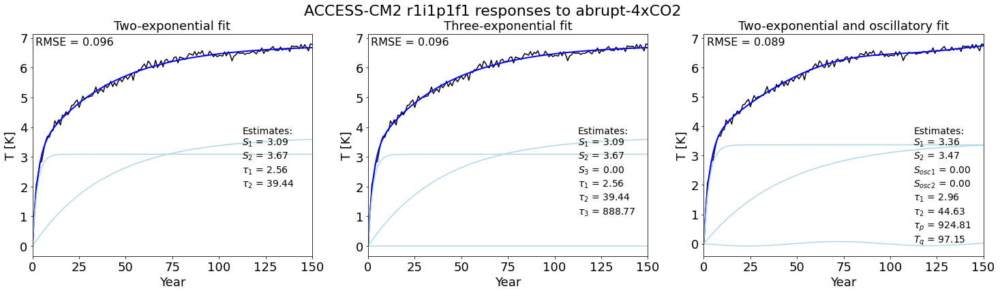

GISS-E2-1-G


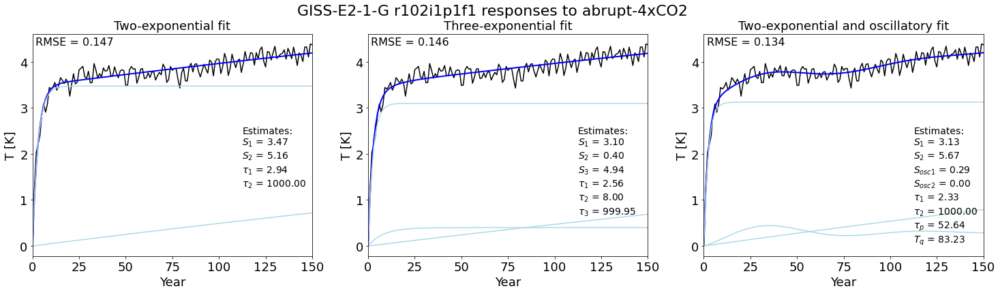

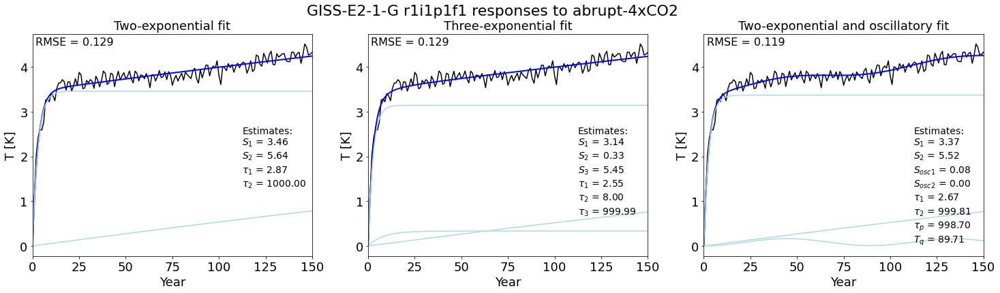

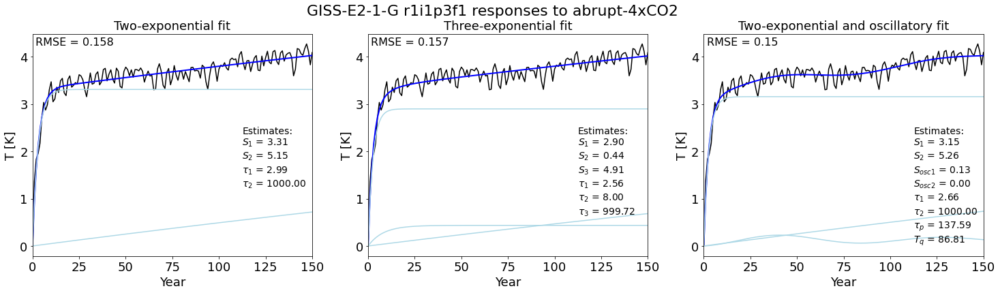

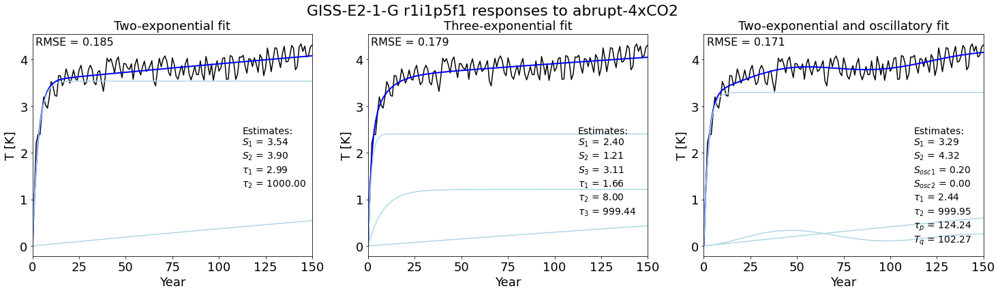

ICON-ESM-LR


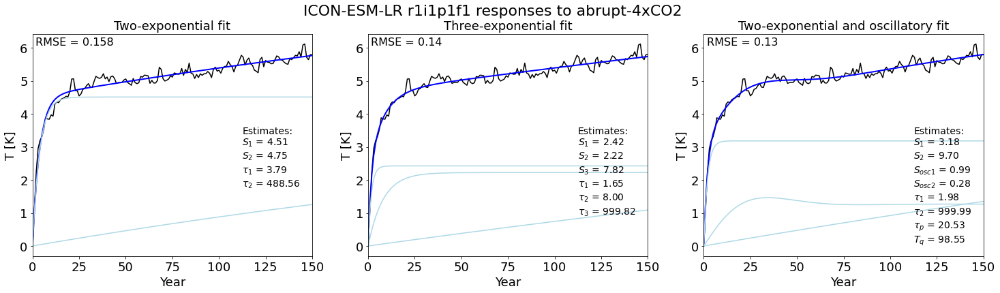

KIOST-ESM


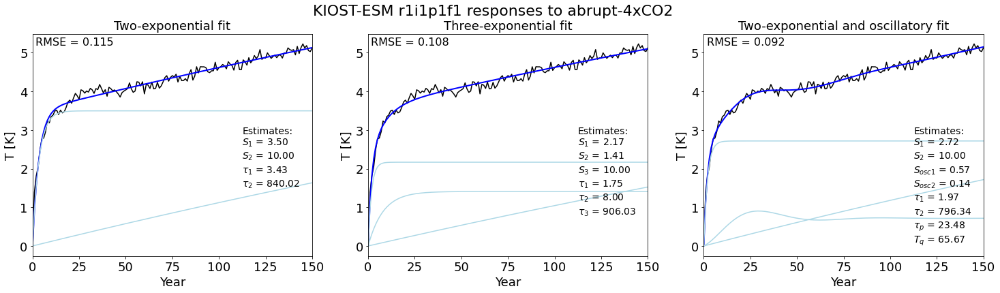

MRI-ESM2-0


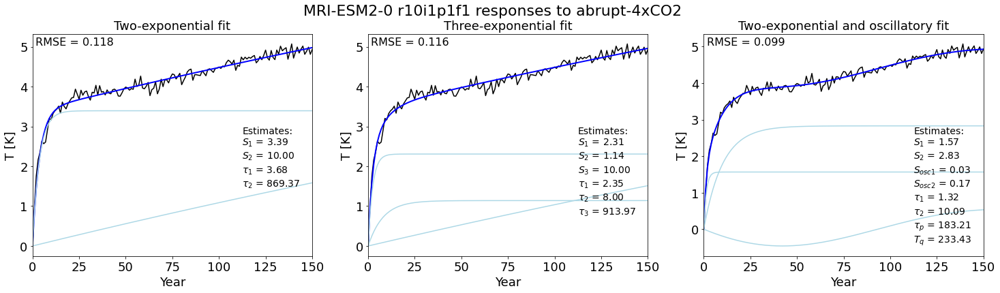

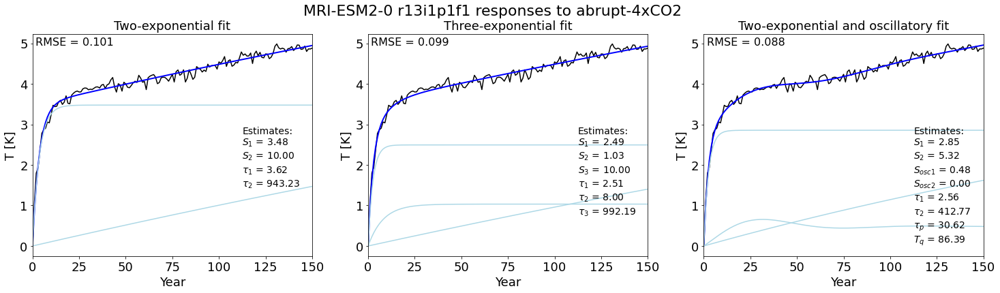

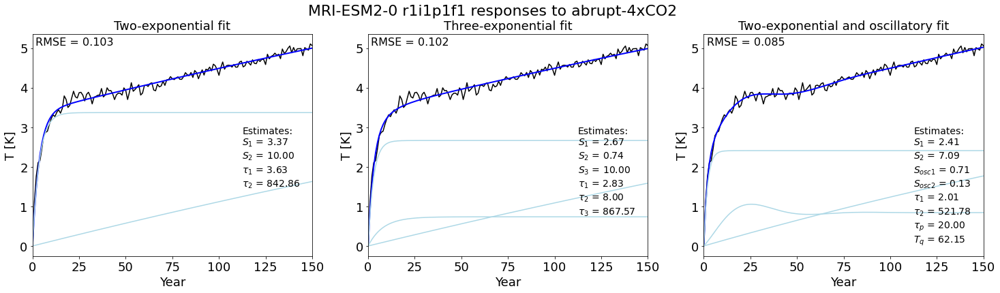

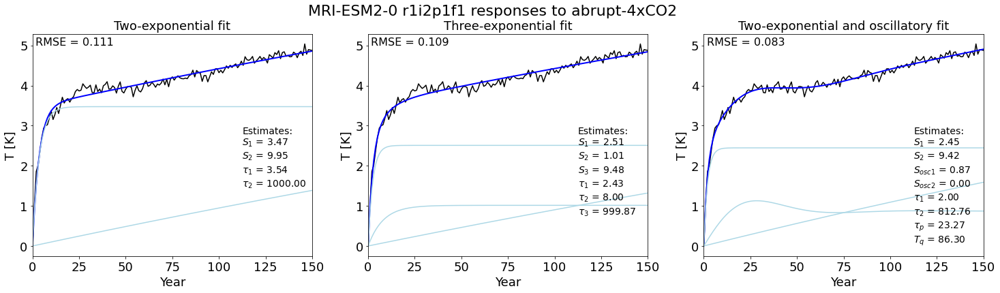

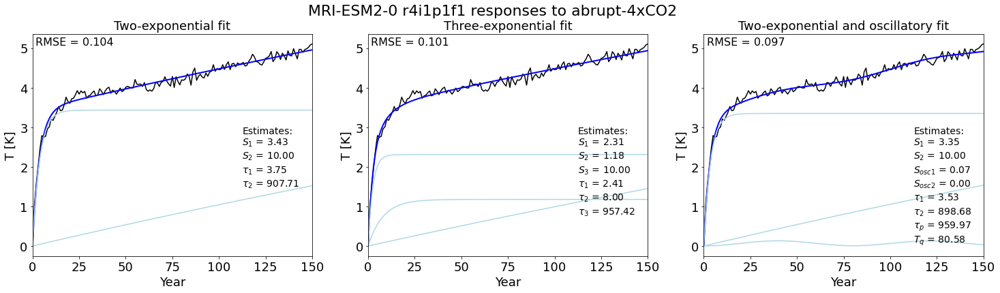

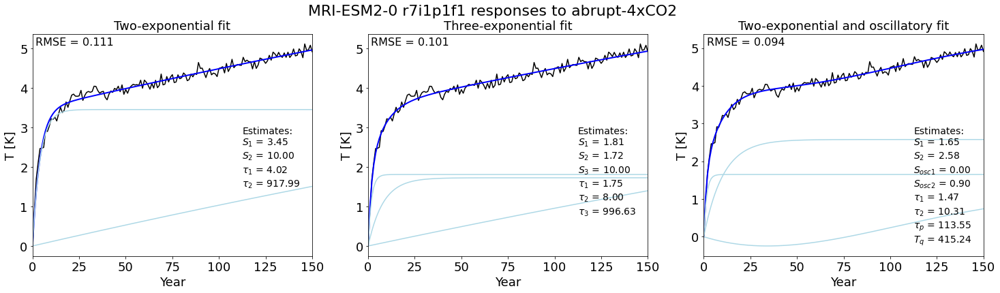

NorESM2-LM


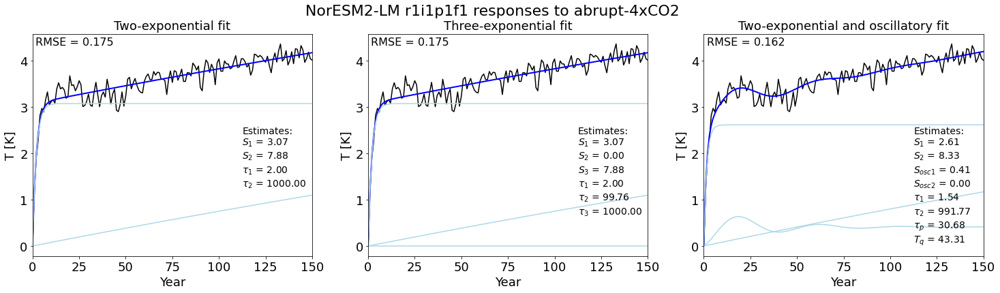

SAM0-UNICON


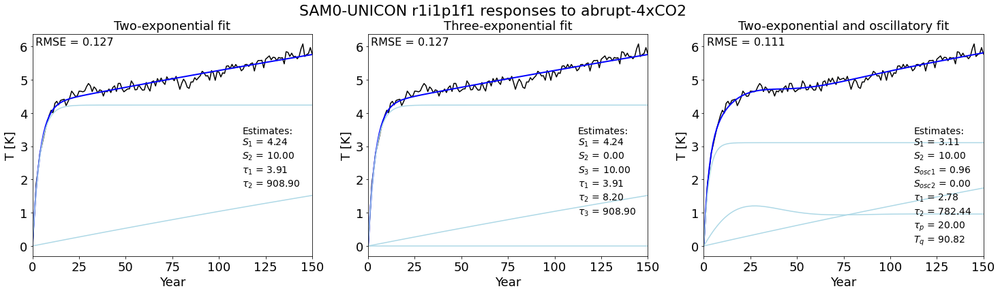

TaiESM1


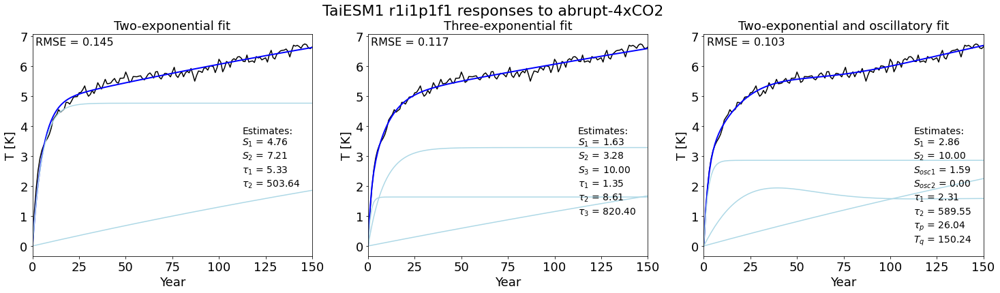

In [18]:
for model in ['ACCESS-CM2', 'GISS-E2-1-G', 'ICON-ESM-LR', 'KIOST-ESM', 'MRI-ESM2-0', 'NorESM2-LM', 'SAM0-UNICON', 'TaiESM1']:
#for model in member_dict:
    print(model)
    for member in member_dict[model]:
        data = load_anom(model, exp, member, length_restriction = 150)
        deltaN = data['rsdt'] - data['rsut'] - data['rlut']
        deltaT = data['tas']; years = np.arange(1,150+1)
        if len(deltaT)<150:
            continue
        deltaT0 = np.concatenate(([0],deltaT)); years0 = np.concatenate(([0],years))
        plot_3fits(years0, deltaT0, model, exp, member, load_results = True)
        plt.show()

In [ ]:
fig, axes = plt.subplots(nrows = 4, ncols = 4, figsize = [30,26])
ax = np.concatenate(axes)
k = 0 # axis index
for model in ['ACCESS-CM2', 'GISS-E2-1-G', 'ICON-ESM-LR', 'KIOST-ESM', 'MRI-ESM2-0', 'NorESM2-LM', 'SAM0-UNICON', 'TaiESM1']:
#for model in member_dict:
    print(model)
    for member in member_dict[model]:
        data = load_anom(model, exp, member, length_restriction = 150)
        deltaN = data['rsdt'] - data['rsut'] - data['rlut']
        deltaT = data['tas']; years = np.arange(1,150+1)
        if len(deltaT)<150:
            continue
        deltaT0 = np.concatenate(([0],deltaT)); years0 = np.concatenate(([0],years))
        result_file = '../model_results/' + model + '_' + exp + '_' + member + '_expandosc_results.sav'
        model_result = load_modelresult(result_file, funcdefs = {'expandosc_function': expandosc_function})
        ax[k] = modelresult_figure('expandosc', model_result, years0, deltaT0, axis = ax[k])
        ax[k].set_title(model + ' ' + member, fontsize = 16)
        #ax[k].set_title(model + ' ' + exp + ' ' + member, fontsize = 16)
        rmse_change = 100*(rmse_dict[model][member][2] - rmse_dict[model][member][1])/rmse_dict[model][member][1]
        ax[k].text(0.01, 0.9, '% change: ' + str(np.round(rmse_change,1)), transform=ax[k].transAxes, fontsize = 16)
        if k<12:
            ax[k].set_xlabel('')
        k += 1
        
#plt.savefig('../Figures/' + exp + '_16expandosc_results.pdf', format='pdf', dpi=600, bbox_inches="tight")        
#plt.savefig('../Figures/' + exp + '_16expandosc_results.png', format='png', dpi=600, bbox_inches="tight")        


ACCESS-CM2
GISS-E2-1-G
ICON-ESM-LR
KIOST-ESM
MRI-ESM2-0
NorESM2-LM
SAM0-UNICON
TaiESM1


In [118]:
for model in ['ACCESS-CM2', 'GISS-E2-1-G', 'ICON-ESM-LR', 'KIOST-ESM', 'MRI-ESM2-0', 'NorESM2-LM', 'SAM0-UNICON', 'TaiESM1']:
    for member in rmse_dict[model]:
        #print(rmse_dict[model][member])
        print(100*(rmse_dict[model][member][2] - rmse_dict[model][member][1])/rmse_dict[model][member][1])
    

-7.261133999008901
-8.424330946124638
-7.835781590783074
-4.785404786820633
-4.465458260313292
-6.991504725647362
-14.876195738761398
-14.644120712328418
-10.851747347498915
-16.47033659954038
-23.718455298260093
-4.136702370421443
-7.1724153393042585
-7.727025892489654
-13.109275922444978
-11.484518543957789


## HadGEM 0p5xCO2 figure

In [19]:
def monthly_to_annual(x):
    return [np.mean(x.values[(year-1)*12:year*12]) for year in range(1,len(x)+1)];

In [20]:
# load data

model = 'HadGEM3-GC31-LL'; exp = 'abrupt-0p5xCO2'; member = 'r1i1p1f3'
response_model = 'expandosc'; response_function = expandosc_function

data = load_anom(model, exp, member, length_restriction = 150)
deltaN = data['rsdt'] - data['rsut'] - data['rlut']
deltaT = data['tas']; years = np.arange(1,150+1)
deltaT0 = np.concatenate(([0],deltaT)); years0 = np.concatenate(([0],years))
result_file = '../model_results/' + model + '_' + exp + '_' + member + '_' + response_model + '_results.sav'
#deltaT0 *= -1 # flip signs
model_result = load_modelresult(result_file, funcdefs = {response_model + '_function': response_function})

residuals = model_result.best_fit - model_result.data
model_rmse = np.sqrt(np.mean(residuals**2))



si_file = '../Processed_data/si_ext_area_HadGEM3-GC31-LL_abrupt-0p5xCO2_r1i1p1f3_150yrs.nc'
tas_file = '../Processed_data/NH_SH_Glob_dtas_HadGEM3-GC31-LL_abrupt-0p5xCO2_piControl__r1i1p1f3.nc'

si_ds = xr.open_dataset(si_file)
tas_ds = xr.open_dataset(tas_file)
si_NH = si_ds['si_area_n']
si_SH = si_ds['si_area_s']
tas_Glob = tas_ds['glob_dtas']
tas_NH = tas_ds['nh_dtas']
tas_SH = tas_ds['sh_dtas']

si_NH_annual = monthly_to_annual(si_NH)
si_SH_annual = monthly_to_annual(si_SH)

/Users/hege-beatefredriksen/opt/anaconda3/envs/CMIP6analysis/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/hege-beatefredriksen/opt/anaconda3/envs/CMIP6analysis/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


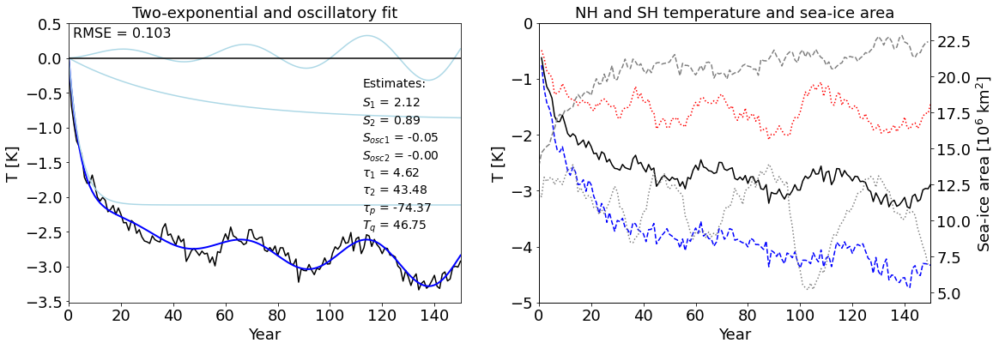

In [106]:
fig, axes = plt.subplots(ncols = 2, figsize = [18,6])

for axis in axes:
    axis.set_xlabel('Year',fontsize = 18)
    axis.set_ylabel('T [K]',fontsize = 18)
    axis.set_xlim(min(years0),max(years0))
    axis.tick_params(axis='both',labelsize=18)
    
ax1 = axes[0]
ax1.plot(years0, deltaT0, color = 'black')
ax1.plot(years0, -model_result.best_fit, '-', label='best fit', color = 'blue', linewidth = 2)
# plot components
ax1.plot(years0, -exp_model1.eval(model_result.params, t=years0), color = 'lightblue')
ax1.plot(years0, -exp_model2.eval(model_result.params, t=years0), color = 'lightblue')
ax1.plot(years0, -osc_model.eval(model_result.params, t=years0), color = 'lightblue')
ax1.axhline(y=0, color = 'black')
ax1.set_title('Two-exponential and oscillatory fit', fontsize = 18)
partoshow = ['S1', 'S2', 'Sosc1', 'Sosc2', 'tau1', 'tau2', 'taup', 'Tq']
textlabels = ['$S_1$', '$S_2$', '$S_{osc1}$', '$S_{osc2}$', r'$\tau_1$', r'$\tau_2$', r'$\tau_p$', r'$T_q$']
        
estimates = [model_result.best_values[par] for par in partoshow]
ax1.text(0.01, 0.95, 'RMSE = ' + str(np.round(model_rmse,3)), transform=ax1.transAxes, fontsize = 16)
ax1.text(0.75,0.77, 'Estimates:', fontsize=14, transform=ax1.transAxes)
for (ind, estimate) in enumerate(estimates):
    ax1.text(0.75,0.5*(1.4-ind/8),textlabels[ind] + ' = ' + str('{:.2f}'.format(np.round(estimate,2))), fontsize=14, transform=ax1.transAxes)
    
    
    
ax2 = axes[1]; ax2si = ax2.twinx()
ax2.set_ylim(-5, 0)
ax2.plot(years, tas_Glob, color = 'black')
ax2.plot(years, tas_NH, '--', color = 'blue')
ax2.plot(years, tas_SH, ':', color = 'red')
ax2.set_title('NH and SH temperature and sea-ice area',fontsize = 18)
ax2si.plot(np.array(si_NH_annual)*10**(-12), '--', color = 'gray') # use a factor 10^6 to convert from m^2 to km^2, then divide out another factor 10^6 and put this in ylabel instead
ax2si.plot(np.array(si_SH_annual)*10**(-12), ':', color = 'gray')
ax2si.tick_params(axis='both',labelsize=18)
ax2si.set_ylabel('Sea-ice area [$10^6$ km$^2$]',fontsize = 18);


#plt.savefig('../Figures/' + model + '_' + exp + '_results.pdf', format='pdf', dpi=600, bbox_inches="tight") 

In [65]:
si_NH

<xarray.DataArray 'si_area_n' (time: 1800)>
array([1.745149e+13, 1.837226e+13, 1.895298e+13, ..., 1.711935e+13,
       2.059422e+13, 2.400695e+13])
Dimensions without coordinates: time
Attributes:
    description:  northern hemispheric sea ice area calculated by multiplying...